# **Intro M2**
In this notebook I set up semi-supervised VAE to predict cell type proportions from bulk data.
This is the M2 model structure.
This is almost identical to "[DIVA: DOMAIN INVARIANT VARIATIONAL AUTOENCODERS](https://arxiv.org/pdf/1905.10427.pdf)".
To breifly describe the model, we have 3 independent encoders that encode for different sources of variation: cell-type proportion, sample-id, and everything else (slack).
To enforce this disentanglement, there are classification losses on the cell-type and smaple_id embeddings.
The embeddings are then concatenated together and used as input to a joint decoder.
When used in the no label is available for the cell-type proportion, the output of the classifier is used as the latent code.
When it is available, it is directly input into the latent code.
The model is depicted below, except there is an additional latent subspace for predicting the perturbation status.
This latent subspace is structured in the same was as the encoder for sample_id.



The experimental set-up is as follows:
All data is from Kang dataset.
We generate pesudobulks from the original data, which contains 8 samples and 1 stimulated and one ctrl condition per sample.
We either perturb all cells, a single cell-type, or no cell types. 
This is done when we generate the pseudobulks by sampling from either perturbed or non-perturbed cells within each sample.
This is denoted in the parameter `exp_id`, it can be "all-kang", "mono-kang", "b-kang", "cd4Naive-kang", or "none-kang"
This is like a perturbation that would cause one cell type to change.
We use 2 samples as the "labeled" data (meaning each sample has a ground truth cell-type proportion and it is from the cell-type proportion) and 6 samples with unlabeled data (ground truth proportions are not used in training.)




This code was based off of DIVA's codebase: https://github.com/AMLab-Amsterdam/DIVA

Semi-supervised training method was take from here:
And this tutorial: https://github.com/bjlkeng/sandbox/tree/master/notebooks/vae-semi_supervised_learning with an awesome accomanying blogpost: https://bjlkeng.github.io/posts/semi-supervised-learning-with-variational-autoencoders/

Another codebase referenced: https://github.com/saemundsson/semisupervised_vae


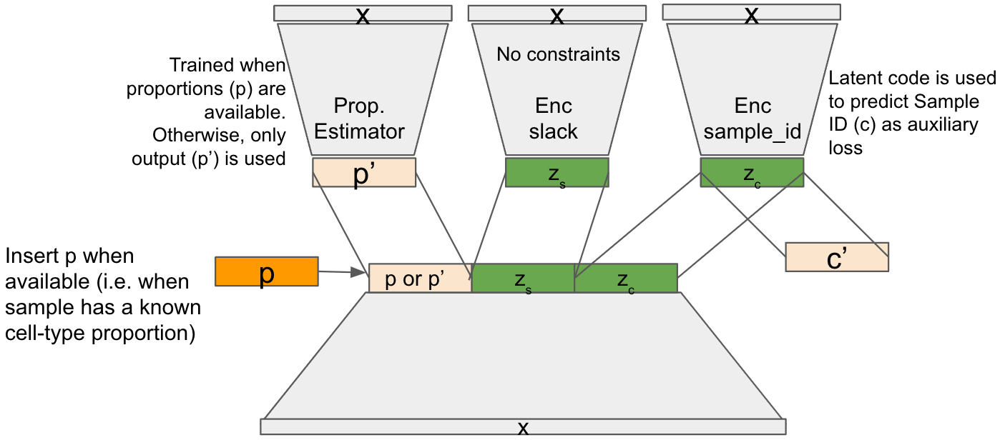

# **Imports**

In [17]:
# general imports
import scanpy as sc

import warnings
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Lambda, Flatten, Softmax, ReLU, ELU, LeakyReLU
from tensorflow.keras.layers import concatenate as concat
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mean_absolute_error, mean_squared_error, KLDivergence
from tensorflow.keras.datasets import mnist
from tensorflow.keras.activations import relu, linear
from tensorflow.keras.utils import to_categorical, normalize, plot_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers.legacy import Adam
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from scipy.stats import spearmanr, pearsonr, ttest_ind, wilcoxon
from scipy.spatial.distance import euclidean
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score
from PIL import Image

from tqdm import tnrange, tqdm_notebook
import ipywidgets

# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# import the SC_preprocessing code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from sc_preprocessing import sc_preprocess
from method_comparison import validation_plotting as vp


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [18]:
from importlib import reload  # Python 3.4+
reload(sc_preprocess)
reload(vp)

<module 'method_comparison.validation_plotting' from '/beevol/home/davidson/checkouts/sc_bulk_ood/exploratory_experiments/../method_comparison/validation_plotting.py'>

In [19]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_covid_data/"
bulk_aug_data_path = f"{os.getcwd()}/../data/bulk_data/covid/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_covid/"
cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_covid/"

cibersort_genes_path = f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_phenoclasses.CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_refsample.bm.K999.txt"


cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/" +
                        "CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_refsample.bm.K999.txt")


num_genes = 7000

exp_id = "all-covid"

# Set-up experimental variables

In [20]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 13

# number of patients/domains/samples expected
n_tot_samples = 445 # 3 "patients", old / young

# number of drugs (one-hot encoded)
n_drugs = 2

# number of types of sequencing (one-hot encoded)
n_bulk = 2

# experiment id
lab_file_name = exp_id


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [21]:
in_name = "covid_bulk_processed"


# read in the real bulk data
processed_sc_file = f"{bulk_aug_data_path}/{in_name}.h5ad"
adata = sc.read_h5ad(processed_sc_file)


# now get the sc ref training data

# read in healthy first
sample_order = ['H1', 'H2', 'H3', 'H4', 'H5', 'H6']

X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_covid_pseudobulk_file(sc_aug_data_path, curr_samp, "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

# now read in covid
sample_order = ['C1 A', 'C1 B', 'C3', 'C4', 'C7']
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_covid_pseudobulk_file(sc_aug_data_path, curr_samp, "STIM", "Test", exp_id)
    pseudobulks_df.columns = gene_df

    X_concat = pd.concat([X_concat, pseudobulks_df])
    Y_concat = pd.concat([Y_concat, prop_df])
    meta_concat = pd.concat([meta_concat, metadata_df])



# format the bulk data
real_bulk_df = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# now we have a new gene_df
gene_df = pd.DataFrame(intersect_genes)
gene_df.columns = ["gene_ids"]
gene_df.set_index(gene_df["gene_ids"])
gene_df = gene_df.gene_ids

# get the bulk metadata formatted
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)

# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(real_bulk_df.shape[0])]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])

# remove outlier samples
outlier_samp_ids = ['9920', '9388', '5011', '5399', '6228', '6529',
                    '6586', '7160', '8122', '8436', '8795',
                    '9058', '9127', '9614', '9636', '9931']
keep_idx = np.where(np.isin(meta_df.sample_id, outlier_samp_ids, invert=True))
X_full = X_full.iloc[keep_idx]
Y_full = Y_full.iloc[keep_idx]
meta_df = meta_df.iloc[keep_idx]

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


H1
H2
H3
H4
H5
H6
C1 A
C1 B
C3
C4
C7


<ipython-input-21-d5ac1eaa7e5c>:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["isTraining"] = "Train"
<ipython-input-21-d5ac1eaa7e5c>:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["cell_prop_type"] = "realistic"
<ipython-input-21-d5ac1eaa7e5c>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [22]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type
0,H1,CTRL,Train,random,sc_ref
1,H1,CTRL,Train,random,sc_ref
2,H1,CTRL,Train,random,sc_ref
3,H1,CTRL,Train,random,sc_ref
4,H1,CTRL,Train,random,sc_ref
...,...,...,...,...,...
20_8860-T00,8860,CTRL,Train,realistic,bulk
20_9153-T00,9153,CTRL,Train,realistic,bulk
20_9153-T63,9153,CTRL,Train,realistic,bulk
20_9719-T00,9719,CTRL,Train,realistic,bulk


In [23]:
X_full

,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A4GALT,A4GNT,AAAS,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,148.163460,0.000000,2.079442,0.000000,153.133290,28.079239,0.000000,3.465736,1.386294,22.180715,...,76.363957,82.484504,20.506739,74.873435,234.872503,2.772589,134.771812,416.755245,760.724803,311.487736
0,89.560885,7.624619,0.000000,2.772589,36.736801,40.320331,7.624619,4.852030,0.000000,59.610674,...,52.679194,51.986042,73.944738,94.059566,292.639309,2.079442,220.891942,782.736384,938.193951,299.009063
0,89.246047,1.386294,0.000000,6.931472,241.124333,99.382684,2.079442,4.158883,0.000000,75.553019,...,99.813172,59.610679,88.958363,108.771997,284.230830,6.238325,180.231803,459.349770,1035.768613,307.378715
0,137.256587,2.079442,4.158883,2.772589,112.760900,32.577922,0.693147,6.238325,5.545177,60.996948,...,71.342045,51.986053,65.914636,125.303164,316.677348,2.772589,235.135241,414.098287,884.088406,236.639256
0,61.062588,0.000000,3.465736,1.386294,180.048165,68.675794,0.000000,0.000000,2.772589,28.419046,...,37.953209,134.470443,33.218959,140.486763,225.626009,2.079442,194.042468,533.448400,896.498453,285.759814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20_8860-T00,0.000000,67.959999,178.899994,0.000000,4.000000,9.000000,0.000000,0.000000,0.000000,932.000000,...,77.110001,52.000000,46.919998,158.080002,1593.000000,2.000000,466.000000,32209.990234,3578.000000,343.000000
20_9153-T00,0.000000,49.680000,74.900002,0.000000,61.330002,25.670000,3.000000,3.000000,1.000000,866.000000,...,75.580002,18.000000,28.290001,85.709999,1284.000000,0.000000,298.000000,23673.000000,2628.000000,187.000000
20_9153-T63,0.000000,52.119999,84.570000,0.000000,33.919998,22.080000,0.000000,6.000000,0.000000,810.000000,...,60.000000,23.000000,45.630001,61.369999,1094.000000,5.000000,281.000000,27321.000000,2330.000000,248.000000
20_9719-T00,0.000000,62.540001,132.550003,0.000000,10.100000,18.900000,0.000000,0.000000,0.000000,773.000000,...,106.339996,110.000000,25.450001,112.550003,1100.000000,0.000000,352.000000,22531.000000,2913.000000,294.000000


In [24]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim == "STIM")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)



# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))
idx_top = np.argpartition(X_CoV, -6356)[-6356:] # num_genes
gene_df = gene_df.iloc[idx_top]


In [25]:
tab = meta_df.groupby(['samp_type', 'sample_id']).size()
tab.unstack()

sample_id,5002,5012,5023,5035,5038,5039,5054,5061,5063,5068,...,C1 B,C3,C4,C7,H1,H2,H3,H4,H5,H6
samp_type,,,,,,,,,,,,,,,,,,,,,
bulk,11.0,1.0,3.0,1.0,3.0,8.0,4.0,2.0,1.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sc_ref,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2300.0,2300.0,2300.0,2300.0,2300.0,2300.0,2300.0,2300.0,2300.0,2300.0


In [26]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Test,NaN,11500.0
Train,1515.0,13800.0


In [27]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,14760,555


In [28]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,1515,13800


In [29]:
X_train_df

,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A4GALT,A4GNT,AAAS,...,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3
0,148.163460,0.000000,2.079442,0.000000,153.133290,28.079239,0.000000,3.465736,1.386294,22.180715,...,76.363957,82.484504,20.506739,74.873435,234.872503,2.772589,134.771812,416.755245,760.724803,311.487736
0,89.560885,7.624619,0.000000,2.772589,36.736801,40.320331,7.624619,4.852030,0.000000,59.610674,...,52.679194,51.986042,73.944738,94.059566,292.639309,2.079442,220.891942,782.736384,938.193951,299.009063
0,89.246047,1.386294,0.000000,6.931472,241.124333,99.382684,2.079442,4.158883,0.000000,75.553019,...,99.813172,59.610679,88.958363,108.771997,284.230830,6.238325,180.231803,459.349770,1035.768613,307.378715
0,137.256587,2.079442,4.158883,2.772589,112.760900,32.577922,0.693147,6.238325,5.545177,60.996948,...,71.342045,51.986053,65.914636,125.303164,316.677348,2.772589,235.135241,414.098287,884.088406,236.639256
0,61.062588,0.000000,3.465736,1.386294,180.048165,68.675794,0.000000,0.000000,2.772589,28.419046,...,37.953209,134.470443,33.218959,140.486763,225.626009,2.079442,194.042468,533.448400,896.498453,285.759814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20_8860-T00,0.000000,67.959999,178.899994,0.000000,4.000000,9.000000,0.000000,0.000000,0.000000,932.000000,...,77.110001,52.000000,46.919998,158.080002,1593.000000,2.000000,466.000000,32209.990234,3578.000000,343.000000
20_9153-T00,0.000000,49.680000,74.900002,0.000000,61.330002,25.670000,3.000000,3.000000,1.000000,866.000000,...,75.580002,18.000000,28.290001,85.709999,1284.000000,0.000000,298.000000,23673.000000,2628.000000,187.000000
20_9153-T63,0.000000,52.119999,84.570000,0.000000,33.919998,22.080000,0.000000,6.000000,0.000000,810.000000,...,60.000000,23.000000,45.630001,61.369999,1094.000000,5.000000,281.000000,27321.000000,2330.000000,248.000000
20_9719-T00,0.000000,62.540001,132.550003,0.000000,10.100000,18.900000,0.000000,0.000000,0.000000,773.000000,...,106.339996,110.000000,25.450001,112.550003,1100.000000,0.000000,352.000000,22531.000000,2913.000000,294.000000


In [30]:
X_train

array([[1.48163460e+02, 0.00000000e+00, 2.07944155e+00, ...,
        4.16755245e+02, 7.60724803e+02, 3.11487736e+02],
       [8.95608854e+01, 7.62461901e+00, 0.00000000e+00, ...,
        7.82736384e+02, 9.38193951e+02, 2.99009063e+02],
       [8.92460470e+01, 1.38629436e+00, 0.00000000e+00, ...,
        4.59349770e+02, 1.03576861e+03, 3.07378715e+02],
       ...,
       [0.00000000e+00, 5.21199989e+01, 8.45699997e+01, ...,
        2.73210000e+04, 2.33000000e+03, 2.48000000e+02],
       [0.00000000e+00, 6.25400009e+01, 1.32550003e+02, ...,
        2.25310000e+04, 2.91300000e+03, 2.94000000e+02],
       [0.00000000e+00, 8.77799988e+01, 1.51240005e+02, ...,
        2.88969902e+04, 3.28200000e+03, 3.11000000e+02]])

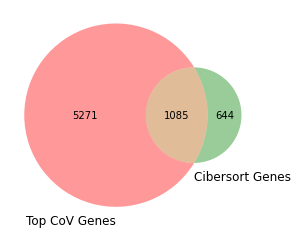

In [31]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [32]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

In [33]:
def pearsonr_2D(x, y):
    """computes pearson correlation coefficient
       where x is a 1D and y a 2D array"""

    upper = np.sum((x - np.mean(x)) * (y - np.mean(y, axis=1)[:,None]), axis=1)
    lower = np.sqrt(np.sum(np.power(x - np.mean(x), 2)) * np.sum(np.power(y - np.mean(y, axis=1)[:,None], 2), axis=1))
    
    rho = upper / lower
    
    return rho

In [34]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()



/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 26815 samples in 0.191s...
[t-SNE] Computed neighbors for 26815 samples in 38.417s...
[t-SNE] Computed conditional probabilities for sample 1000 / 26815
[t-SNE] Computed conditional probabilities for sample 2000 / 26815
[t-SNE] Computed conditional probabilities for sample 3000 / 26815
[t-SNE] Computed conditional probabilities for sample 4000 / 26815
[t-SNE] Computed conditional probabilities for sample 5000 / 26815
[t-SNE] Computed conditional probabilities for sample 6000 / 26815
[t-SNE] Computed conditional probabilities for sample 7000 / 26815
[t-SNE] Computed conditional probabilities for sample 8000 / 26815
[t-SNE] Computed conditional probabilities for sample 9000 / 26815
[t-SNE] Computed conditional probabilities for sample 10000 / 26815
[t-SNE] Computed conditional probabilities for sample 11000 / 26815
[t-SNE] Computed conditional probabilities for sample 12000 / 26815
[t-SNE] Computed conditional probabilities for sa

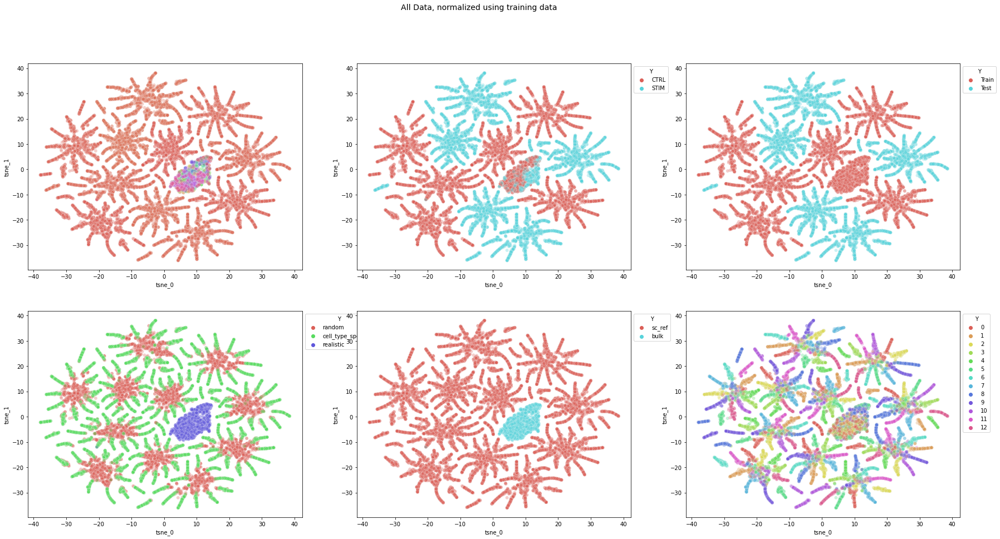

In [35]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(1515, 2)
(1515, 2)


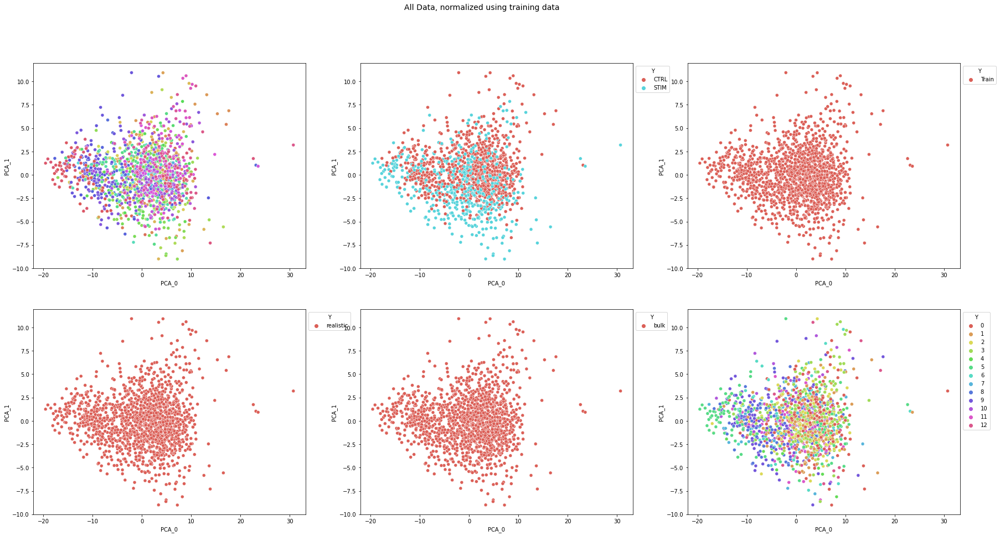

In [36]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1515 samples in 0.011s...
[t-SNE] Computed neighbors for 1515 samples in 0.164s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1515
[t-SNE] Computed conditional probabilities for sample 1515 / 1515
[t-SNE] Mean sigma: 2.385304
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.909401
[t-SNE] KL divergence after 500 iterations: 1.467928
(1515, 2)
(1515, 2)


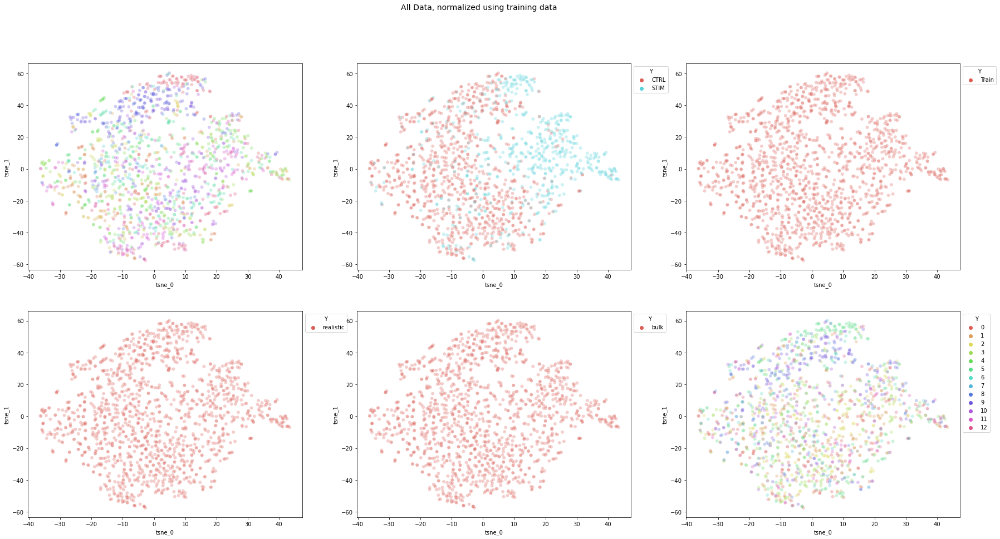

In [39]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1515 samples in 0.011s...
[t-SNE] Computed neighbors for 1515 samples in 0.153s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1515
[t-SNE] Computed conditional probabilities for sample 1515 / 1515
[t-SNE] Mean sigma: 2.385304
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.517555
[t-SNE] KL divergence after 500 iterations: 1.461849
(1515, 2)
(1515, 2)


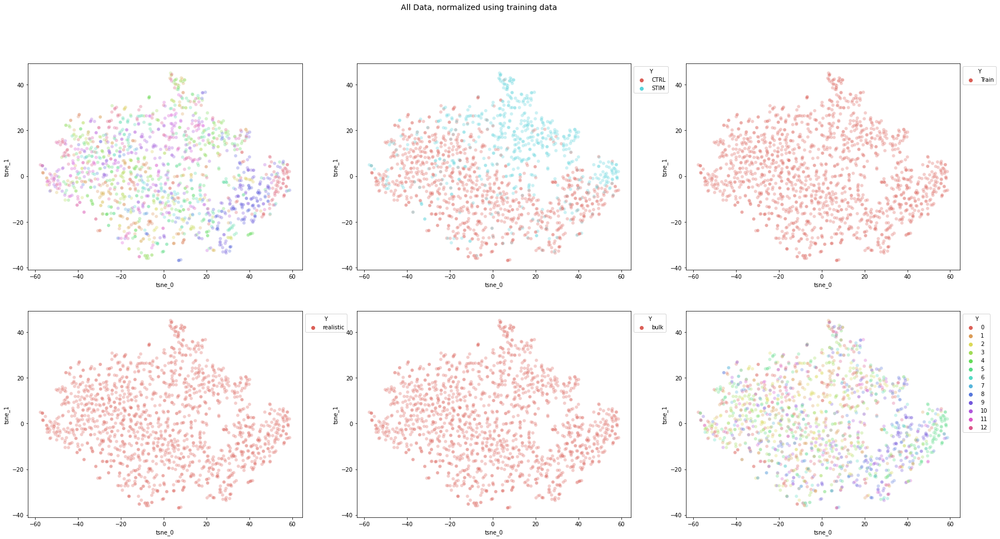

In [40]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **M2 Model Definition**

## Hyperparameters

In [41]:

##################################################
#####. Hyperparameters
##################################################

batch_size = 500
n_epoch = 250 #100 500 

alpha_rot = 100000 #1000000
alpha_drug = 10000 #1000000
alpha_bulk = 10000 #1000000
alpha_prop = 100 #100

beta_kl_slack = 0.1 # 10 ###
beta_kl_rot = 100 # 100 ###
beta_kl_drug = 100 # 100 ###
beta_kl_bulk = 100 # 100 ###


n_x = X_full.shape[1]
n_y = Y_full.shape[1]
n_label = n_tot_samples  # 8 donors 
n_drugs = n_drugs  # number of drugs one-hot encoded
n_bulk = n_bulk  # number of drugs one-hot encoded
n_label_z = 64  # 64 dimensional representation of rotation


# the network dimensions are 784 > 512 > proportion_dim < 512 < 784
n_z = Y_full.shape[1] # latent space size, one latent dimension PER cell type
encoder_dim = 512 # dim of encoder hidden layer 512 
decoder_dim = 512 # dim of encoder hidden layer 512 
decoder_out_dim = n_x # dim of decoder output layer

# labeled classifier
class_dim1 = 512 # 512 
class_dim2 = 256 # 256 


activ = 'relu'
optim = tf.keras.optimizers.legacy.Adam(learning_rate=0.0005) #0.001
print(f"length of X {n_x} and length of y {n_y} n_label {n_label} and n_drugs {n_drugs} and n_bulk {n_bulk}")



length of X 7000 and length of y 13 n_label 445 and n_drugs 2 and n_bulk 2


## Encoder + Y classifier

In [42]:
# declare the Keras tensor we will use as input to the encoder
X = Input(shape=(n_x,))
Y = Input(shape=(n_y,))
label = Input(shape=(n_label,))
props = Input(shape=(n_y,))
z_in = Input(shape=(n_y+n_label_z+n_label_z+n_label_z,))
cls_in = Input(shape=(n_label_z,))

inputs = X

# set up encoder network
# this is an encoder with 512 hidden layer
# Dense is a functor, with given initializations (activation and hidden layer dimension)
# After initialization, the functor is returned and inputs is used as an arguement
encoder_s = Dense(encoder_dim, activation=activ, name="encoder_slack")(inputs)
encoder_r = Dense(encoder_dim, activation=activ, name="encoder_rot")(inputs)
encoder_d = Dense(encoder_dim, activation=activ, name="encoder_drug")(inputs)
encoder_b = Dense(encoder_dim, activation=activ, name="encoder_bulk")(inputs)

# now from the hidden layer, you get the mu and sigma for 
# the latent space

mu_slack = Dense(n_label_z, activation='linear', name = "mu_slack")(encoder_s)
l_sigma_slack = Dense(n_label_z, activation='linear', name = "sigma_slack")(encoder_s)

mu_rot = Dense(n_label_z, activation='linear', name = "mu_rot")(encoder_r)
l_sigma_rot = Dense(n_label_z, activation='linear', name = "sigma_rot")(encoder_r)


mu_drug = Dense(n_label_z, activation='linear', name = "mu_drug")(encoder_d)
l_sigma_drug = Dense(n_label_z, activation='linear', name = "sigma_drug")(encoder_d)


mu_bulk = Dense(n_label_z, activation='linear', name = "mu_bulk")(encoder_b)
l_sigma_bulk = Dense(n_label_z, activation='linear', name = "sigma_bulk")(encoder_b)



# set up labeled classifier
#defining the architecture of the classifier

class_hidden1 = Dense(class_dim1, activation=activ, name = "cls_h1")
class_hidden2 = Dense(class_dim2, activation=activ, name="cls_h2")
class_out = Dense(n_y, activation='softmax', name="cls_out")

#x_concat_lab = tf.keras.layers.concatenate([inputs, label])
#classifier_h1 = class_hidden1(tf.keras.layers.Concatenate()([inputs, label]))
classifier_h1 = class_hidden1(inputs)
classifier_h2 = class_hidden2(classifier_h1)
Y_cls = class_out(classifier_h2)



## Latent Space

In [43]:
# now we need the sampler from mu and sigma
def sample_z(args):
    mu, l_sigma, n_z = args
    eps = K.random_normal(shape=(batch_size, n_z), mean=0., stddev=1.)
    return mu + K.exp(l_sigma / 2) * eps


# Sampling latent space
z_slack = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_slack")([mu_slack, l_sigma_slack, n_label_z])
z_rot = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_rot")([mu_rot, l_sigma_rot, n_label_z])
z_drug = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_drug")([mu_drug, l_sigma_drug, n_label_z])
z_bulk = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_bulk")([mu_bulk, l_sigma_bulk, n_label_z])

z_concat_lab = concat([z_slack, Y, z_rot, z_drug, z_bulk])
z_concat_unlab = concat([z_slack, Y_cls, z_rot, z_drug, z_bulk])

## Decoder + Classifiers

In [44]:
def null_f(args):
    return args

###### DECODER
# set up decoder network
# this is a decoder with 512 hidden layer
decoder_hidden = Dense(decoder_dim, activation=activ, name = "decoder_h1")

# final reconstruction
decoder_out = Dense(decoder_out_dim, activation='sigmoid', name = "decoder_out")

d_in = Input(shape=(n_label_z+n_y+n_label_z+n_label_z+n_label_z,))
d_h1 = decoder_hidden(d_in)
d_out = decoder_out(d_h1)

# set up the decoder part that links to the encoder
# labeled decoder
h_lab = decoder_hidden(z_concat_lab)
outputs_lab = decoder_out(h_lab)

# unlabeled decoder
h_unlab = decoder_hidden(z_concat_unlab)
outputs_unlab = decoder_out(h_unlab)


###### Rotations classifier
# this is the rotation we try to estimate
rot_h1 = ReLU(name = "rot_h1")
rot_h2 = Dense(n_label, activation='linear', name = "rot_h2")
rot_softmax = Softmax(name = "mu_rot_pred")
decoder_sigma_r = Lambda(null_f, name = "l_sigma_rot_pred")


rot_1_out = rot_h1(z_rot)
rot_2_out = rot_h2(rot_1_out)
rotation_outputs = rot_softmax(rot_2_out)
sigma_outputs_r = decoder_sigma_r(l_sigma_rot)



###### Drug classifier
# this is the drug we try to estimate
drug_h1 = ReLU(name = "drug_h1")
drug_h2 = Dense(n_drugs, activation='linear', name = "drug_h2")
drug_softmax = Softmax(name = "mu_drug_pred")
decoder_sigma_d = Lambda(null_f, name = "l_sigma_drug_pred")


drug_1_out = drug_h1(z_drug)
drug_2_out = drug_h2(drug_1_out)
drug_outputs = drug_softmax(drug_2_out)
sigma_outputs_d = decoder_sigma_d(l_sigma_drug)


###### Bulk classifier
# this is the bulk or sc we try to estimate
bulk_h1 = ReLU(name = "bulk_h1")
bulk_h2 = Dense(n_bulk, activation='linear', name = "bulk_h2")
bulk_softmax = Softmax(name = "mu_bulk_pred")
decoder_sigma_d = Lambda(null_f, name = "l_sigma_bulk_pred")


bulk_1_out = bulk_h1(z_bulk)
bulk_2_out = bulk_h2(bulk_1_out)
bulk_outputs = bulk_softmax(bulk_2_out)
sigma_outputs_d = decoder_sigma_d(l_sigma_bulk)








## Loss

In [45]:

def vae_loss(y_true, y_pred):
    recon = K.sum(mean_squared_error(y_true, y_pred), axis=-1)
    kl_rot = beta_kl_rot * K.sum(K.exp(l_sigma_rot) + K.square(mu_rot) - 1. - l_sigma_rot, axis=-1)
    kl_drug = beta_kl_drug * K.sum(K.exp(l_sigma_drug) + K.square(mu_drug) - 1. - l_sigma_drug, axis=-1)
    kl_bulk = beta_kl_bulk * K.sum(K.exp(l_sigma_bulk) + K.square(mu_bulk) - 1. - l_sigma_bulk, axis=-1)
    kl_slack = beta_kl_slack * K.sum(K.exp(l_sigma_slack) + K.square(mu_slack) - 1. - l_sigma_slack, axis=-1)
    return recon + kl_rot +kl_drug + kl_bulk+ kl_slack


def recon_loss(y_true, y_pred):
	return K.sum(mean_squared_error(y_true, y_pred), axis=-1)


def prop_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_prop

def drug_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_drug

def bulk_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_bulk


def class_loss(y_true, y_pred):
    recon = K.sum(K.binary_crossentropy(y_true, y_pred), axis=-1)*alpha_rot
    return recon



## Make the computational graph

In [46]:
classifier = Model(X, Y_cls)

known_prop_vae = Model([X, Y], [outputs_lab, Y_cls, rotation_outputs, drug_outputs, bulk_outputs])
unknown_prop_vae = Model(X, [outputs_unlab, rotation_outputs, drug_outputs, bulk_outputs])

known_prop_vae.compile(optimizer=optim, loss=[vae_loss, prop_loss, class_loss, drug_loss, bulk_loss]) #, metrics = [KL_loss, recon_loss])
unknown_prop_vae.compile(optimizer=optim, loss=[vae_loss, class_loss, drug_loss, bulk_loss]) #, metrics = [KL_loss, recon_loss])

encoder_unlab = Model(X, [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug, z_bulk, mu_bulk, l_sigma_bulk])

encoder_lab = Model([X, Y], [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug, z_bulk, mu_bulk, l_sigma_bulk])


decoder = Model(d_in, d_out)


print(known_prop_vae.summary())
print(unknown_prop_vae.summary())


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 7000)]       0           []                               
                                                                                                  
 encoder_slack (Dense)          (None, 512)          3584512     ['input_1[0][0]']                
                                                                                                  
 encoder_rot (Dense)            (None, 512)          3584512     ['input_1[0][0]']                
                                                                                                  
 encoder_drug (Dense)           (None, 512)          3584512     ['input_1[0][0]']                
                                                                                            

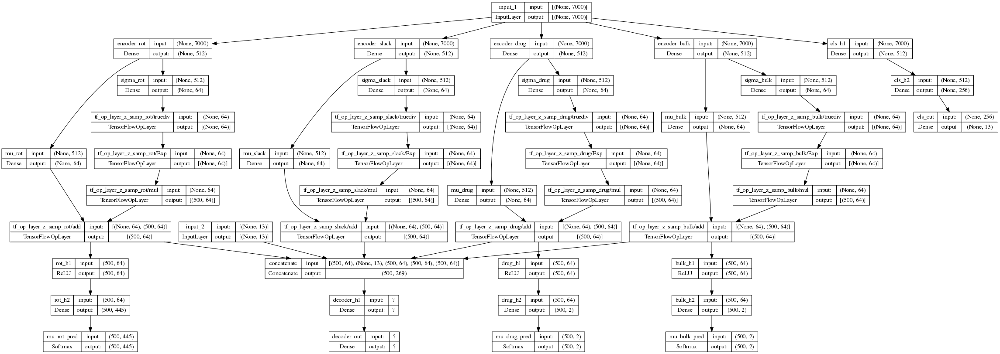

In [47]:
display(plot_model(known_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

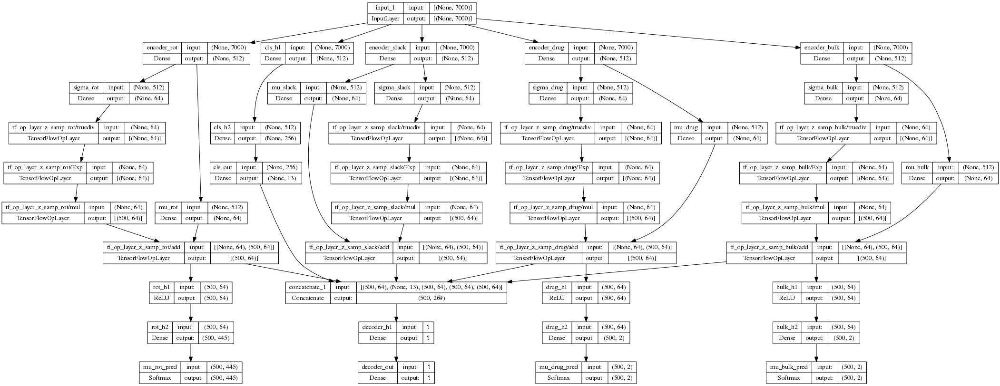

In [48]:
display(plot_model(unknown_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

# **Training**

Here we train using both the known and unknown cell-type proportions.
The labeled data is repeated in order to match the dimension of the unlabeled data so that they have the same batch size.
This code is taken from https://github.com/bjlkeng/sandbox/blob/master/notebooks/vae-semi_supervised_learning/vae-m2-fit-mnist.ipynb

In [49]:


def fit_model(X_unknown_prop, label_unknown_prop, drug_unknown_prop, bulk_unknown_prop, X_known_prop, Y_known_prop, label_known_prop, drug_known_prop, bulk_known_prop, epochs):
    assert len(X_unknown_prop) % len(X_known_prop) == 0, \
            (len(X_unknown_prop), batch_size, len(X_known_prop))
    start = time.time()
    history = []
    meta_hist = []
    
    for epoch in range(epochs):
        unlabeled_index = np.arange(len(X_unknown_prop))
        np.random.shuffle(unlabeled_index)

        # Repeat the unlabeled data to match length of labeled data
        labeled_index = []
        for i in range(len(X_unknown_prop) // len(X_known_prop)):
            l = np.arange(len(X_known_prop))
            np.random.shuffle(l)
            labeled_index.append(l)
        labeled_index = np.concatenate(labeled_index)
        
        batches = len(X_unknown_prop) // batch_size
        for i in range(batches):
            # Labeled
            index_range =  labeled_index[i * batch_size:(i+1) * batch_size]
            loss = known_prop_vae.train_on_batch([X_known_prop[index_range], Y_known_prop[index_range]],
                                                    [X_known_prop[index_range], Y_known_prop[index_range], label_known_prop[index_range], drug_known_prop[index_range], bulk_known_prop[index_range]])
            meta_hist.append(i)

            # Unlabeled
            index_range =  unlabeled_index[i * batch_size:(i+1) * batch_size]
            loss += [unknown_prop_vae.train_on_batch(X_unknown_prop[index_range],
                                                        [X_unknown_prop[index_range], label_unknown_prop[index_range], drug_unknown_prop[index_range], bulk_unknown_prop[index_range]])]

            meta_hist.append(i)

            history.append(loss)
            
    
   
    done = time.time()
    elapsed = done - start
    print("Elapsed: ", elapsed)
    
    return [history, meta_hist]

In [50]:
for layer in classifier.layers:
    print(layer)

In [51]:
for layer in encoder_unlab.layers:
    print(layer.name)

input_1
encoder_slack
encoder_rot
encoder_drug
encoder_bulk
sigma_slack
sigma_rot
sigma_drug
sigma_bulk
tf_op_layer_z_samp_slack/truediv
tf_op_layer_z_samp_rot/truediv
tf_op_layer_z_samp_drug/truediv
tf_op_layer_z_samp_bulk/truediv
tf_op_layer_z_samp_slack/Exp
tf_op_layer_z_samp_rot/Exp
tf_op_layer_z_samp_drug/Exp
tf_op_layer_z_samp_bulk/Exp
mu_slack
tf_op_layer_z_samp_slack/mul
mu_rot
tf_op_layer_z_samp_rot/mul
mu_drug
tf_op_layer_z_samp_drug/mul
mu_bulk
tf_op_layer_z_samp_bulk/mul
tf_op_layer_z_samp_slack/add
tf_op_layer_z_samp_rot/add
tf_op_layer_z_samp_drug/add
tf_op_layer_z_samp_bulk/add


Now train

In [52]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


In [53]:
X_kp.shape

(13800, 7000)

In [54]:
X_unkp.shape

(1515, 7000)

In [55]:
# X_unknown_prop, label_unknown_prop, X_known_prop, Y_known_prop, label_known_prop

unkp_idx = np.random.choice(X_unkp.shape[0], 15000, replace=True)
kp_idx = np.random.choice(X_kp.shape[0], 15000, replace=True)

loss_history = fit_model(X_unkp[unkp_idx],
                    label_unkp[unkp_idx],
                    drug_unkp[unkp_idx],
                    bulk_unkp[unkp_idx],
                    X_kp[kp_idx], 
                    y_kp[kp_idx],
                    label_kp[kp_idx], 
                    drug_kp[kp_idx], 
                    bulk_kp[kp_idx], epochs=n_epoch)



Elapsed:  1705.8482122421265


In [56]:
meta_history = loss_history[1]
loss_history = loss_history[0]

# Plot Loss Curves

In [57]:
# write out the loss for later plotting
# unpack the loss values
labeled_total_loss = [item[0] for item in loss_history]
unlabeled_total_loss = [item[6][0] for item in loss_history]

labeled_recon_loss = [item[1] for item in loss_history]
unlabeled_recon_loss = [item[6][1] for item in loss_history]

labeled_prop_loss = [item[2] for item in loss_history]

labeled_samp_loss = [item[3] for item in loss_history]
unlabeled_samp_loss = [item[6][2] for item in loss_history]

labeled_drug_loss = [item[4] for item in loss_history]
unlabeled_drug_loss = [item[6][2] for item in loss_history]


labeled_bulk_loss = [item[5] for item in loss_history]
unlabeled_bulk_loss = [item[6][2] for item in loss_history]


# make into a dataframe
total_loss = labeled_total_loss + unlabeled_total_loss + [a + b for a, b in zip(labeled_total_loss, unlabeled_total_loss)]
loss_df = pd.DataFrame(data=total_loss, columns=['total_loss'])
loss_df['type'] = ["labeled"]*len(loss_history) + ["unlabeled"]*len(loss_history) + ["sum"]*len(loss_history)
loss_df['batch'] = [*range(len(loss_history))] + [*range(len(loss_history))] + [*range(len(loss_history))]

recon_loss = labeled_recon_loss + unlabeled_recon_loss + [a + b for a, b in zip(labeled_recon_loss, unlabeled_recon_loss)]
loss_df['recon_loss'] = recon_loss

prop_loss = labeled_prop_loss + [0]*len(loss_history) + labeled_prop_loss
loss_df['prop_loss'] = prop_loss

samp_loss = labeled_samp_loss + unlabeled_samp_loss + [a + b for a, b in zip(labeled_samp_loss, unlabeled_samp_loss)]
loss_df['samp_loss'] = samp_loss


drug_loss = labeled_drug_loss + unlabeled_drug_loss + [a + b for a, b in zip(labeled_drug_loss, unlabeled_drug_loss)]
loss_df['drug_loss'] = drug_loss


bulk_loss = labeled_bulk_loss + unlabeled_bulk_loss + [a + b for a, b in zip(labeled_bulk_loss, unlabeled_bulk_loss)]
loss_df['bulk_loss'] = bulk_loss



In [58]:
loss_df

,total_loss,type,batch,recon_loss,prop_loss,samp_loss,drug_loss,bulk_loss
0,5.620062e+06,labeled,0,8359.914062,5277.644531,708551.937500,3.324752e+06,1.573120e+06
1,7.818500e+05,labeled,1,127415.062500,5584.590332,648832.875000,1.549898e+01,1.997113e+00
2,8.735298e+05,labeled,2,210892.187500,5266.479980,657370.250000,7.534844e-01,1.497170e-01
3,9.065088e+05,labeled,3,257296.468750,5045.721680,644166.250000,1.710481e-01,1.482330e-01
4,9.060202e+05,labeled,4,276745.343750,5376.935547,623897.750000,1.516708e-01,1.478349e-01
...,...,...,...,...,...,...,...,...
22495,5.040843e+05,sum,7495,65263.687500,212.243393,69407.968750,6.901830e+04,6.893189e+04
22496,3.689829e+05,sum,7496,65663.132812,234.321518,71776.679688,7.138718e+04,7.128609e+04
22497,4.782925e+05,sum,7497,64026.171875,204.468582,72797.351562,7.220278e+04,7.226966e+04
22498,4.447907e+05,sum,7498,64553.851562,290.355194,68487.601562,6.795729e+04,6.828158e+04


In [59]:
def read_loss_file(res_path, exp_id, unlab_id):
    loss_file = os.path.join(res_path, f"train-{exp_id}-{unlab_id}-DIVA_loss.pkl")
    loss_path = Path(loss_file)
    loss_df = pickle.load( open( loss_path, "rb" ) )
    return loss_df

def make_loss_fig(loss_df, ax, title, loss_to_plot):
    ## plot loss
    g = sns.lineplot(
        x="batch", y=loss_to_plot,
        data=loss_df,
        hue="type",
        legend="full",
        alpha=0.3, ax= ax
    )
    ax.set_title(title)
    return g

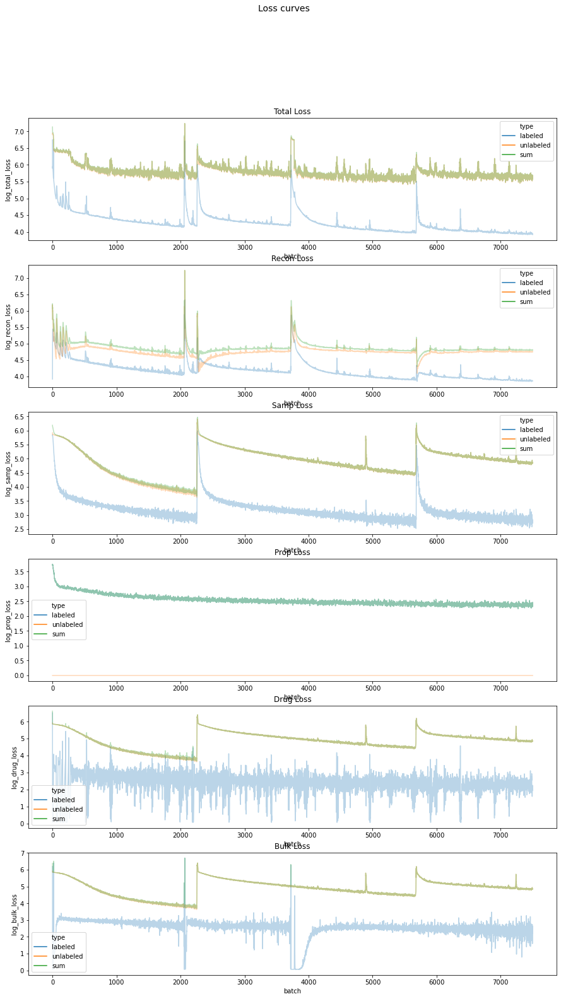

In [60]:

# add the log to make it easier to plot
loss_df["log_total_loss"] = np.log10(loss_df["total_loss"]+1)
loss_df["log_recon_loss"] = np.log10(loss_df["recon_loss"]+1)
loss_df["log_samp_loss"] = np.log10(loss_df["samp_loss"]+1)
loss_df["log_prop_loss"] = np.log10(loss_df["prop_loss"]+1)
loss_df["log_drug_loss"] = np.log10(loss_df["drug_loss"]+1)
loss_df["log_bulk_loss"] = np.log10(loss_df["bulk_loss"]+1)


fig, axs = plt.subplots(6, figsize=(15,25))

make_loss_fig(loss_df, ax=axs[0], title=f"Total Loss", loss_to_plot="log_total_loss")
make_loss_fig(loss_df, ax=axs[1], title=f"Recon Loss", loss_to_plot="log_recon_loss")
make_loss_fig(loss_df, ax=axs[2], title=f"Samp Loss", loss_to_plot="log_samp_loss")
make_loss_fig(loss_df, ax=axs[3], title=f"Prop Loss", loss_to_plot="log_prop_loss")
make_loss_fig(loss_df, ax=axs[4], title=f"Drug Loss", loss_to_plot="log_drug_loss")
make_loss_fig(loss_df, ax=axs[5], title=f"Bulk Loss", loss_to_plot="log_bulk_loss")


fig.suptitle("Loss curves", fontsize=14)

fig.show()

In [61]:
def plot_cell_specific_corr(xval, yval, ax, title, xlab, ylab, class_id):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id
    )
    g.set(ylim=(0, 1))
    g.set(xlim=(0, 1))
    g.plot([0, 1], [0, 1], transform=g.transAxes)

    ax.set_title(title)
    return g


def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


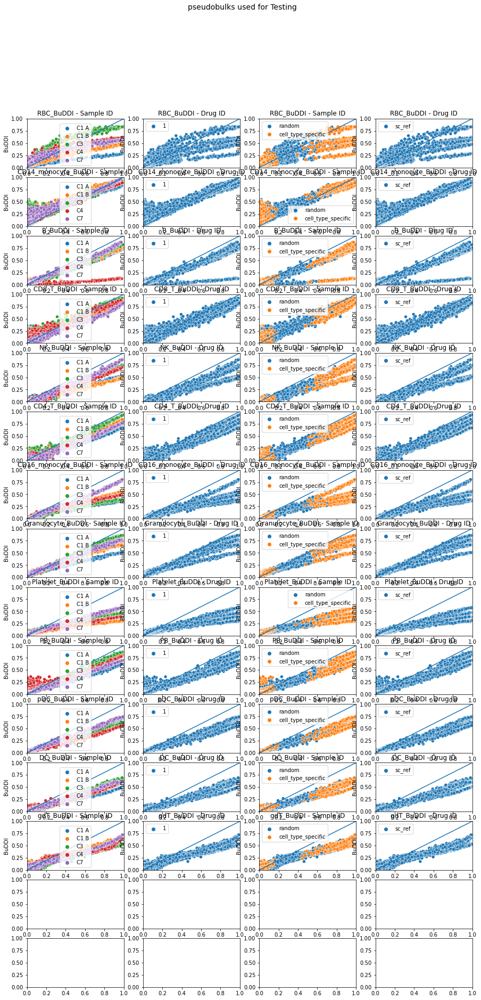

In [62]:
idx_tmp = idx_test
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]



fig, axs = plt.subplots(15, 4, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=label_temp[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
        
    row_idx = row_idx +1


fig.suptitle("pseudobulks used for Testing", fontsize=14)

fig.show()

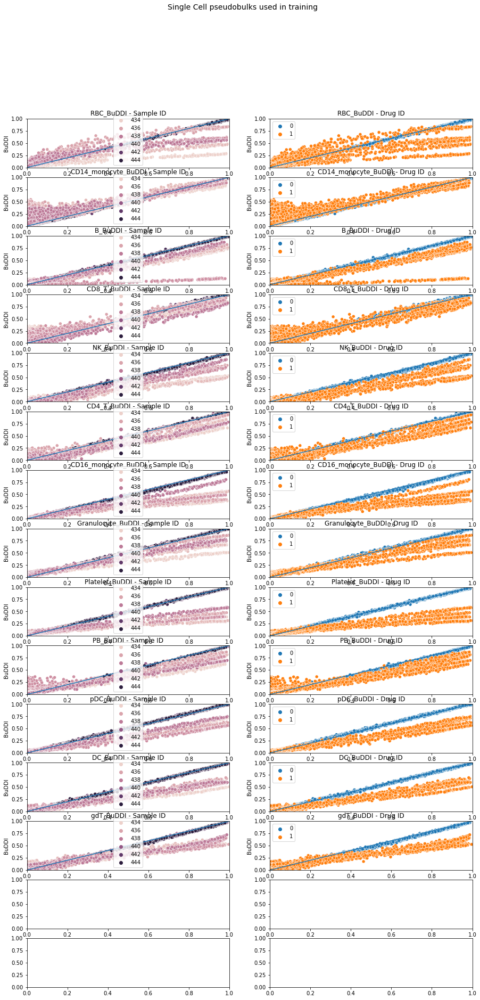

In [63]:
idx_tmp = idx_sc
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

fig, axs = plt.subplots(15, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Label_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("Single Cell pseudobulks used in training", fontsize=14)

fig.show()

### compare errors

In [64]:
def read_diva_result_file(res_path, train_id, test_id, unlab_id):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-DIVA.pkl")
    res_path = Path(res_file)
    res_df = pickle.load( open( res_path, "rb" ) )
    return res_df

def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df




In [65]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


def get_errors_single(y_true, y_est):
  mse_err = [mean_sqr_error(y_true, y_est)]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true, y_est)[0]]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true, y_est)[0]]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"] + ["SPR"] + ["PEAR"]

  return plot_df




In [66]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,Y_max
0,H1,CTRL,Train,random,sc_ref,RBC
1,H1,CTRL,Train,random,sc_ref,CD4_T
2,H1,CTRL,Train,random,sc_ref,CD8_T
3,H1,CTRL,Train,random,sc_ref,NK
4,H1,CTRL,Train,random,sc_ref,DC
...,...,...,...,...,...,...
20_8860-T00,8860,CTRL,Train,realistic,bulk,Platelet
20_9153-T00,9153,CTRL,Train,realistic,bulk,Platelet
20_9153-T63,9153,CTRL,Train,realistic,bulk,Platelet
20_9719-T00,9719,CTRL,Train,realistic,bulk,Platelet


In [67]:
tab = meta_df.groupby(['cell_prop_type', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
cell_prop_type,,
cell_type_specific,7800,6500
random,6000,5000
realistic,960,555


In [68]:
idx_tmp = np.logical_and(meta_df.cell_prop_type == "random", meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]

idx_tmp.shape

(6000,)

MSqE mean: 0.00010333901850809586, median: 8.225685198131916e-05, max: 0.0009652594246824279
Spearman mean: 0.8875261720575038, median: 0.9285714285714285, max: 1.0
Pearson mean: 0.9959514391095992, median: 0.9977171477536813, max: 0.9999979596964118
MSqE mean: 0.006176786463848606, median: 0.004475417501702869, max: 0.06936131618722308
Spearman mean: 0.5631424673521398, median: 0.5934065934065934, max: 0.967032967032967
Pearson mean: 0.7871360328405737, median: 0.8335973364547591, max: 0.9998034984212971


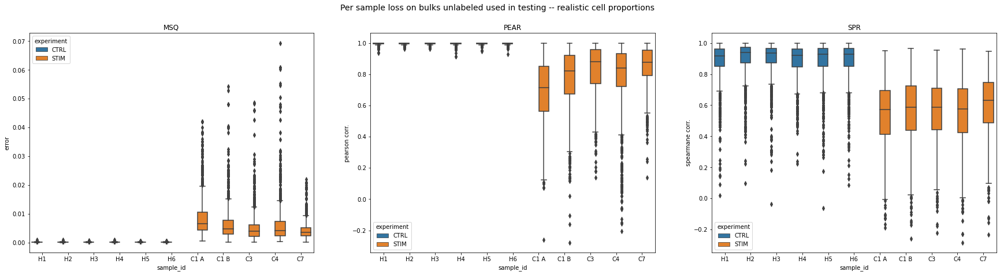

In [69]:
# Now compare across samples

idx_tmp = np.logical_and(meta_df.cell_prop_type == "random", meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]
#idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_ctrl = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 3)


# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "random", meta_df.stim == "STIM")
idx_tmp = np.where( idx_tmp)[0]
#idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_stim = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 3)

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in testing -- realistic cell proportions", fontsize=14)

fig.show()

MSqE mean: 5.07811549686126e-05, median: 3.4130078244488695e-05, max: 0.0006165460562627899
Spearman mean: 0.75635460693153, median: 0.8076923076923077, max: 1.0
Pearson mean: 0.9995590119898031, median: 0.9998036708573632, max: 0.9999984577340122
MSqE mean: 0.010834539006787164, median: 0.006974095908241957, max: 0.07119859552602321
Spearman mean: 0.3815519864750635, median: 0.39560439560439564, max: 0.9560439560439561
Pearson mean: 0.8895021133805043, median: 0.9529303952281782, max: 0.9998084031286404


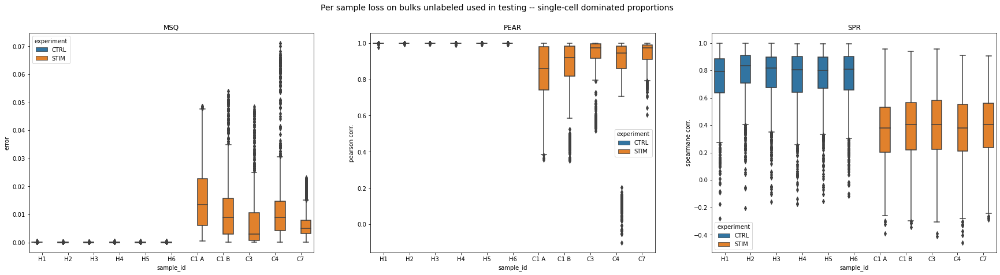

In [70]:
# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "cell_type_specific", meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_ctrl = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 3)


# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "cell_type_specific", meta_df.stim == "STIM")
idx_tmp = np.where( idx_tmp)[0]


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_stim = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 3)

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in testing -- single-cell dominated proportions", fontsize=14)

fig.show()

# **Inspect the output**

## TSNE training data

Now that we know what is expected, let's see what we get from the model. We find that out of our encoder, after applying ReLU, we get pretty close to the expected proportions.

## Plot Reconstruction

In [71]:

recon_idx = meta_df.isTraining == "Train"
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 7500, replace=True)


meta_temp = meta_df.iloc[recon_idx]


Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)


label_temp = np.copy(Label_full[recon_idx])
perturb_temp = Drug_full[recon_idx]

X_temp = np.copy(X_full[recon_idx])


prop_outputs = classifier.predict(X_temp, batch_size=batch_size)



# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug, z_bulk, mu_bulk, l_sigma_bulk = encoder_unlab.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)




/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 7500 samples in 0.055s...
[t-SNE] Computed neighbors for 7500 samples in 2.966s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7500
[t-SNE] Computed conditional probabilities for sample 2000 / 7500
[t-SNE] Computed conditional probabilities for sample 3000 / 7500
[t-SNE] Computed conditional probabilities for sample 4000 / 7500
[t-SNE] Computed conditional probabilities for sample 5000 / 7500
[t-SNE] Computed conditional probabilities for sample 6000 / 7500
[t-SNE] Computed conditional probabilities for sample 7000 / 7500
[t-SNE] Computed conditional probabilities for sample 7500 / 7500
[t-SNE] Mean sigma: 1.487301
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.268929
[t-SNE] KL divergence after 500 iterations: 0.977430
(7500, 2)
(7500, 2)


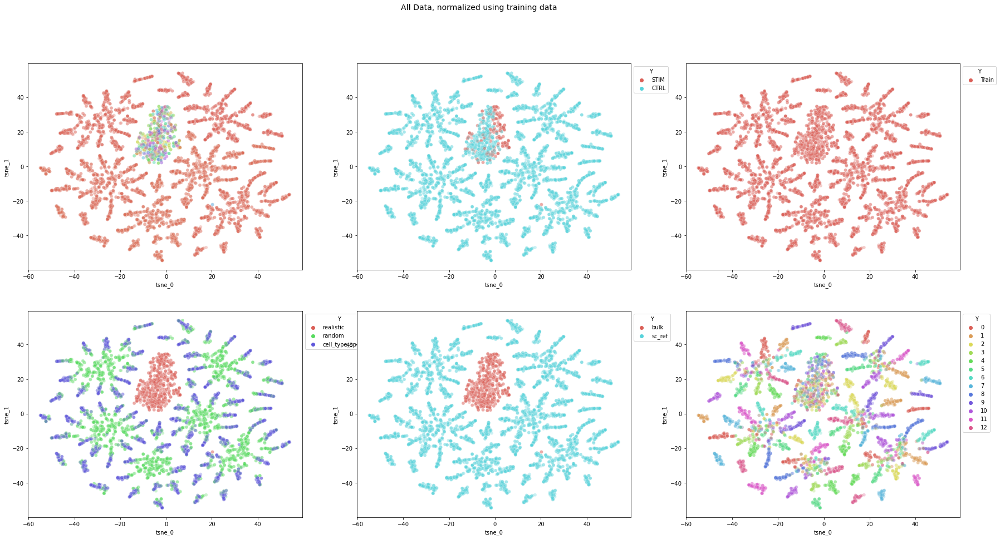

In [72]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_temp)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_tsne(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)


fig.show()

(7500, 2)
(7500, 2)


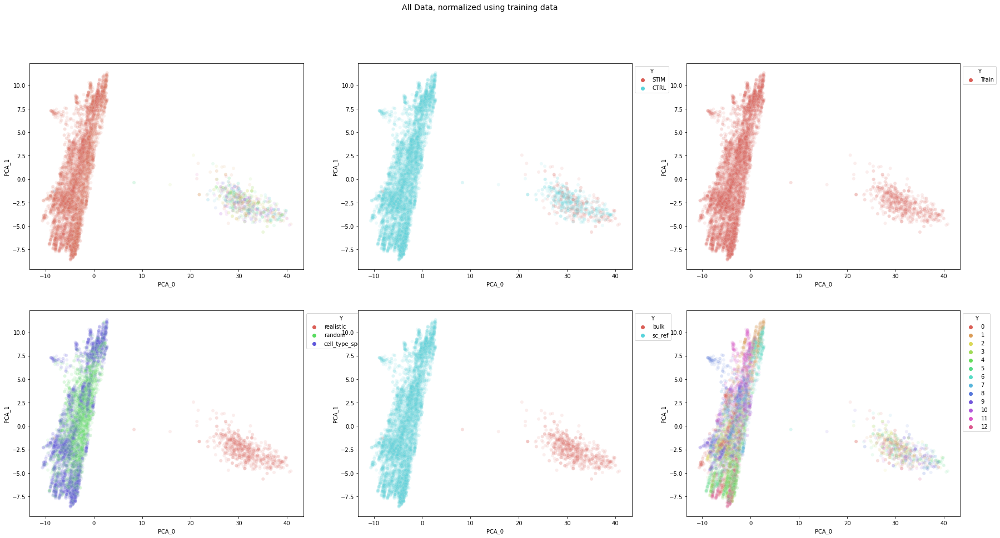

In [73]:
## plot samples
plot_df = vp.get_pca_for_plotting(X_temp)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_pca(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_pca(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_pca(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_pca(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_pca(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)
axs[0,0].legend([],[], frameon=False)

fig.show()

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 7500 samples in 0.066s...
[t-SNE] Computed neighbors for 7500 samples in 7.011s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7500
[t-SNE] Computed conditional probabilities for sample 2000 / 7500
[t-SNE] Computed conditional probabilities for sample 3000 / 7500
[t-SNE] Computed conditional probabilities for sample 4000 / 7500
[t-SNE] Computed conditional probabilities for sample 5000 / 7500
[t-SNE] Computed conditional probabilities for sample 6000 / 7500
[t-SNE] Computed conditional probabilities for sample 7000 / 7500
[t-SNE] Computed conditional probabilities for sample 7500 / 7500
[t-SNE] Mean sigma: 1.542305
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.765724
[t-SNE] KL divergence after 500 iterations: 0.985470
(7500, 2)
(7500, 2)


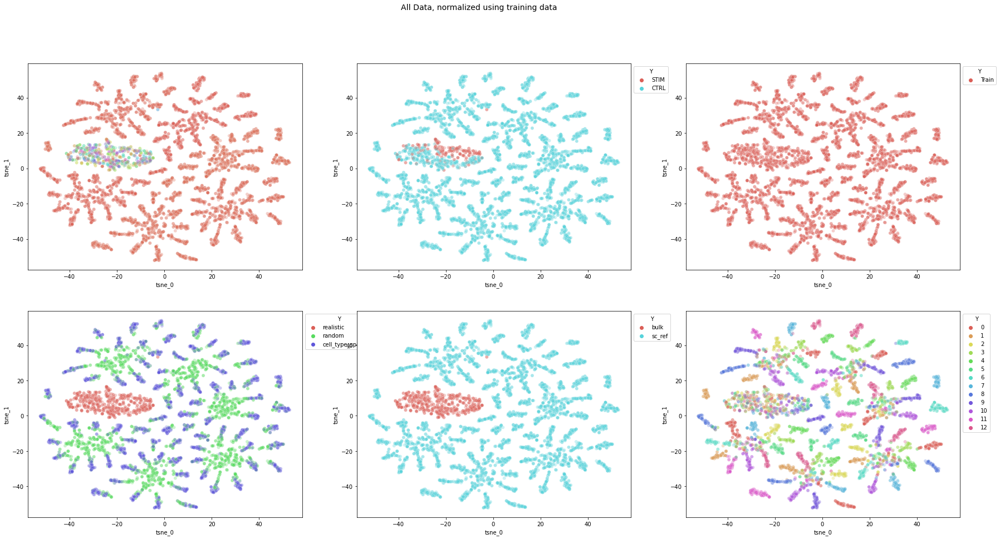

In [74]:
## plot samples
plot_df = vp.get_tsne_for_plotting(decoded_outputs)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_tsne(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)
axs[0,0].legend([],[], frameon=False)

fig.show()

(7500, 2)
(7500, 2)


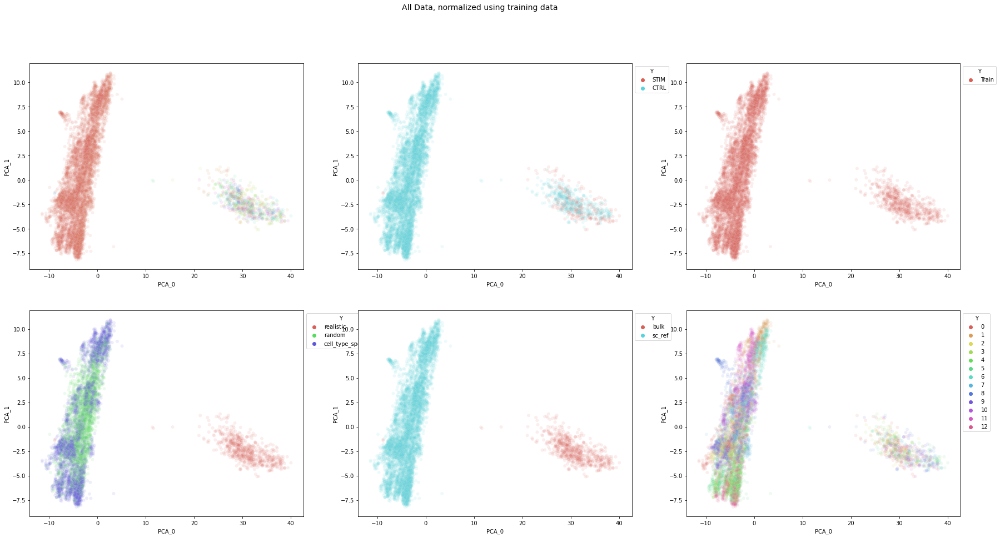

In [75]:
## plot samples
plot_df = vp.get_pca_for_plotting(decoded_outputs)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_pca(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_pca(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_pca(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_pca(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_pca(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)
axs[0,0].legend([],[], frameon=False)

fig.show()

(15000, 2)
(15000, 2)


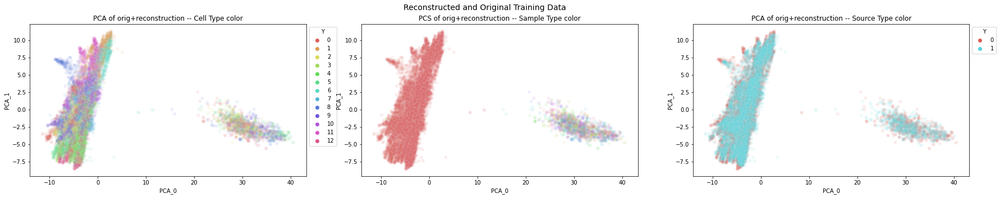

In [76]:
# make duplicated
X_dup = np.vstack([X_temp, decoded_outputs])


Y_dup = np.append(Y_temp, Y_temp)

label_dup = np.append(label_temp, label_temp)
perturb_dup = np.append(perturb_temp, perturb_temp)
source_dup = np.asarray(np.append([0]*7500, [1]*7500))

fig, axs = plt.subplots(1, 3, figsize=(30,5))

plot_df = vp.get_pca_for_plotting(np.asarray(X_dup))
vp.plot_pca(plot_df, color_vec=Y_dup, ax=axs[0], title="PCA of orig+reconstruction -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_dup, ax=axs[1], title="PCS of orig+reconstruction -- Sample Type color")
vp.plot_pca(plot_df, color_vec=source_dup, ax=axs[2], title="PCA of orig+reconstruction -- Source Type color")


fig.suptitle("Reconstructed and Original Training Data", fontsize=14)
axs[1].legend([],[], frameon=False)

fig.show()

In [77]:
recon_idx = np.where(meta_df.isTraining == "Test")[0]
len(recon_idx)

11500

### Plot latent spaces

In [81]:
len(idx_train)

15315

In [82]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,Y_max
0,H1,CTRL,Train,random,sc_ref,RBC
1,H1,CTRL,Train,random,sc_ref,CD4_T
2,H1,CTRL,Train,random,sc_ref,CD8_T
3,H1,CTRL,Train,random,sc_ref,NK
4,H1,CTRL,Train,random,sc_ref,DC
...,...,...,...,...,...,...
20_8860-T00,8860,CTRL,Train,realistic,bulk,Platelet
20_9153-T00,9153,CTRL,Train,realistic,bulk,Platelet
20_9153-T63,9153,CTRL,Train,realistic,bulk,Platelet
20_9719-T00,9719,CTRL,Train,realistic,bulk,Platelet


In [83]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,14760,555


In [84]:

tab = meta_df.iloc[idx_train].groupby(['sample_id', 'cell_prop_type']).size()
tab.unstack()

cell_prop_type,cell_type_specific,random,realistic
sample_id,,,
5002,NaN,NaN,11.0
5012,NaN,NaN,1.0
5023,NaN,NaN,3.0
5035,NaN,NaN,1.0
5038,NaN,NaN,3.0
...,...,...,...
H2,1300.0,1000.0,NaN
H3,1300.0,1000.0,NaN
H4,1300.0,1000.0,NaN


In [85]:
idx_tmp = np.where(meta_df.isTraining == "Train")[0]
len_idx = idx_tmp.shape[0]
len_idx

15315

Number unique Y: 13
plotting
plotting1
(10000, 2)
(10000, 2)
plotting2
(10000, 2)
(10000, 2)
plotting3
(10000, 2)
(10000, 2)
plotting4
(10000, 2)
(10000, 2)


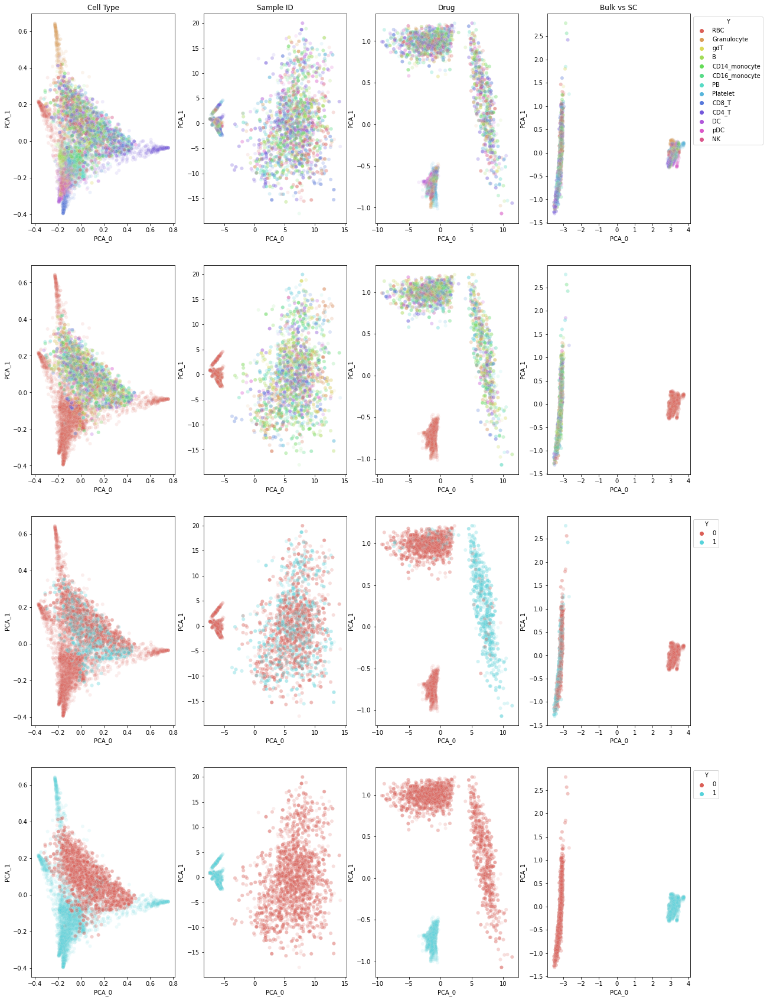

In [86]:
# plot proportions on labeled 10x and unlabeled 10x
# this is the training data
idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = true_prop_df.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, _, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)

"""
z_slack = z_slack[0:len_idx]
z_rot = z_rot[0:len_idx]
mu_rot = mu_rot[0:len_idx]
z_drug = z_drug[0:len_idx]
mu_drug = mu_drug[0:len_idx]
z_bulk = z_bulk[0:len_idx]
mu_bulk = mu_bulk[0:len_idx]
prop_outputs = prop_outputs[0:len_idx]
decoded_outputs = decoded_outputs[0:len_idx]

Y_temp = Y_temp[0:len_idx]
label_temp = label_temp[0:len_idx]
perturb_temp = perturb_temp[0:len_idx]
bulk_temp = bulk_temp[0:len_idx]
"""

print("plotting")


fig, axs = plt.subplots(4, 4, figsize=(20,30))
print("plotting1")

plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,0], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,0], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,0], title="")
print("plotting2")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_rot))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,1], title="Sample ID")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,1], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,1], title="")
print("plotting3")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,2], title="Drug")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,2], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,2], title="")

print("plotting4")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_bulk))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,3], title="Bulk vs SC")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,3], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,3], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,3], title="")


#fig.suptitle("Training Data", fontsize=14)
count_idx = 0
for ax1 in axs:
    inner_count_idx = 0
    for ax2 in ax1:
        if count_idx == 1 or inner_count_idx < 3:
            ax2.get_legend().remove()
        inner_count_idx = inner_count_idx + 1

    count_idx = count_idx + 1
fig.show()

#out_plot = os.path.join(res_data_path, f"output1.pdf")
#fig.savefig(out_plot, dpi=300)


    
#out_plot = os.path.join(res_data_path, f"output2.pdf")
#fig.savefig(out_plot, dpi=300)

In [87]:
idx_tmp = np.where(meta_df.isTraining=="Test")[0]
meta_df.iloc[idx_tmp].cell_prop_type.value_counts()

cell_type_specific    6500
random                5000
Name: cell_prop_type, dtype: int64

In [88]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Test", meta_df.cell_prop_type != "cell_type_specific"))[0]
len_idx = idx_tmp.shape[0]
len_idx

5000

Number unique Y: 13
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)


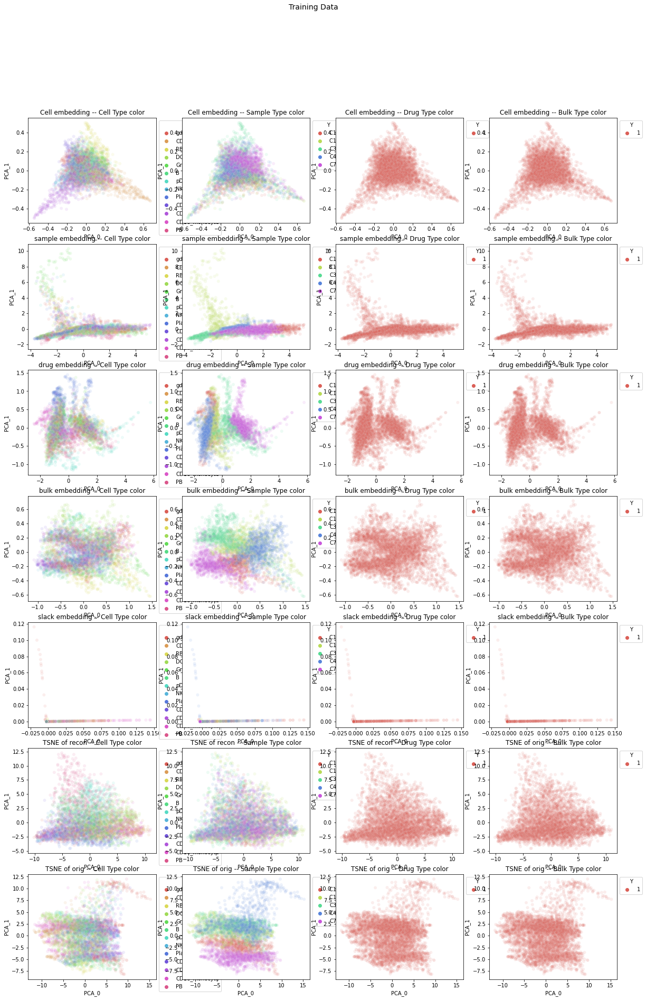

In [89]:
# plot proportions on labeled 10x and unlabeled 10x
# this is the training data
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Test", meta_df.cell_prop_type != "cell_type_specific"))[0]
len_idx = idx_tmp.shape[0]
#idx_tmp = np.tile(idx_tmp, 5)

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = true_prop_df.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]

bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, mu_slack, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)

z_slack = z_slack[0:len_idx]
mu_slack = mu_slack[0:len_idx]
z_rot = z_rot[0:len_idx]
mu_rot = mu_rot[0:len_idx]
z_drug = z_drug[0:len_idx]
mu_drug = mu_drug[0:len_idx]
z_bulk = z_bulk[0:len_idx]
mu_bulk = mu_bulk[0:len_idx]
prop_outputs = prop_outputs[0:len_idx]
decoded_outputs = decoded_outputs[0:len_idx]

X_temp = X_temp[0:len_idx]
Y_temp = Y_temp[0:len_idx]
label_temp = label_temp[0:len_idx]
perturb_temp = perturb_temp[0:len_idx]
bulk_temp = bulk_temp[0:len_idx]

fig, axs = plt.subplots(7, 4, figsize=(20,30))

plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[0,1], title="Cell embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[0,2], title="Cell embedding -- Drug Type color")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[0,3], title="Cell embedding -- Bulk Type color")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_rot))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[1,0], title="sample embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="sample embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[1,2], title="sample embedding -- Drug Type color")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[1,3], title="sample embedding -- Bulk Type color")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[2,0], title="drug embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[2,1], title="drug embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="drug embedding -- Drug Type color")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[2,3], title="drug embedding -- Bulk Type color")


plot_df = vp.get_pca_for_plotting(np.asarray(mu_bulk))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[3,0], title="bulk embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[3,1], title="bulk embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[3,2], title="bulk embedding -- Drug Type color")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,3], title="bulk embedding -- Bulk Type color")


plot_df = vp.get_pca_for_plotting(np.asarray(mu_slack))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[4,0], title="slack embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[4,1], title="slack embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[4,2], title="slack embedding -- Drug Type color")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[4,3], title="slack embedding -- Bulk Type color")

plot_df = vp.get_pca_for_plotting(np.asarray(decoded_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[5,0], title="TSNE of recon -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[5,1], title="TSNE of recon -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[5,2], title="TSNE of recon -- Drug Type color")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[5,3], title="TSNE of orig -- Bulk Type color")


plot_df = vp.get_pca_for_plotting(np.asarray(X_temp))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[6,0], title="TSNE of orig -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[6,1], title="TSNE of orig -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[6,2], title="TSNE of orig -- Drug Type color")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[6,3], title="TSNE of orig -- Bulk Type color")




fig.suptitle("Training Data", fontsize=14)

fig.show()

## Do latent space projectsions

### drug perturbation

In [91]:

def calc_buddi_perturbation(meta_df, X_full, scaler, encoder_unlab, decoder, batch_size):

    # get the training data
    # so we can use it to get the latent codes

    # get the points we are interested in
    # we will use their codes and only change the perturbation codes
    subset_idx = np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "cell_type_specific")
    subset_idx = np.where(subset_idx)[0] 
    subset_idx = np.random.choice(subset_idx, 8000, replace=True)

    temp_meta_df = meta_df.iloc[subset_idx]

    X_temp = np.copy(X_full)
    X_unpert = X_temp[subset_idx,]

    Y_temp = np.copy(Y_full)
    Y_temp = Y_temp[subset_idx]


    #####
    # get cell type specific latent codes
    #####

    _, _, _, _, _, _, z_unpert, _, _, _, _, _  = encoder_unlab.predict(X_unpert, batch_size=batch_size)


    #####
    # get perturbation latent codes
    #####

    # get the index to get the perturbation latent codes
    pert_code_idx = np.logical_and(meta_df.isTraining == "Train", meta_df.stim == "STIM")
    pert_code_idx = np.where(pert_code_idx)[0] 
    pert_code_idx = np.random.choice(pert_code_idx, len(subset_idx), replace=True)
    z_slack, _, _, z_samples, _, _, z_pert, _, _, z_bulk, _, _  = encoder_unlab.predict(X_temp[pert_code_idx,], batch_size=batch_size)



    # make the metadata table 
    temp_meta_df = meta_df.iloc[subset_idx]
    temp_meta_df.isTraining = "Test"
    temp_meta_df.cell_prop_type = "cell_type_specific"


    ######
    # now put it all together
    ######

    # now concatenate together and add the stim codes to the latent
    z_concat_perturb = np.hstack([z_slack, Y_temp, z_samples, z_pert, z_bulk])
    decoded_0_1 = decoder.predict(z_concat_perturb, batch_size=batch_size)
    decoded_0_1 = scaler.inverse_transform(decoded_0_1)

    # now concatenate together and add the stim codes to the latent
    z_concat_unperturb = np.hstack([z_slack, Y_temp, z_samples, z_unpert, z_bulk])
    decoded_0_0 = decoder.predict(z_concat_unperturb, batch_size=batch_size)
    decoded_0_0 = scaler.inverse_transform(decoded_0_0)




    return (temp_meta_df, decoded_0_0, decoded_0_1)


In [92]:

ctrl_test_meta_df, decoded_0_0, decoded_0_1 = calc_buddi_perturbation(meta_df, X_full, scaler, encoder_unlab, decoder, batch_size)


<ipython-input-91-a17fad3de5cc>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
<ipython-input-91-a17fad3de5cc>:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"


In [93]:
ctrl_test_meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,Y_max
1127,H6,CTRL,Test,cell_type_specific,sc_ref,B
1320,H1,CTRL,Test,cell_type_specific,sc_ref,CD8_T
1641,H5,CTRL,Test,cell_type_specific,sc_ref,Platelet
1249,H5,CTRL,Test,cell_type_specific,sc_ref,CD14_monocyte
2289,H4,CTRL,Test,cell_type_specific,sc_ref,DC
...,...,...,...,...,...,...
2178,H6,CTRL,Test,cell_type_specific,sc_ref,pDC
1946,H5,CTRL,Test,cell_type_specific,sc_ref,CD16_monocyte
1727,H3,CTRL,Test,cell_type_specific,sc_ref,NK
1297,H6,CTRL,Test,cell_type_specific,sc_ref,CD14_monocyte


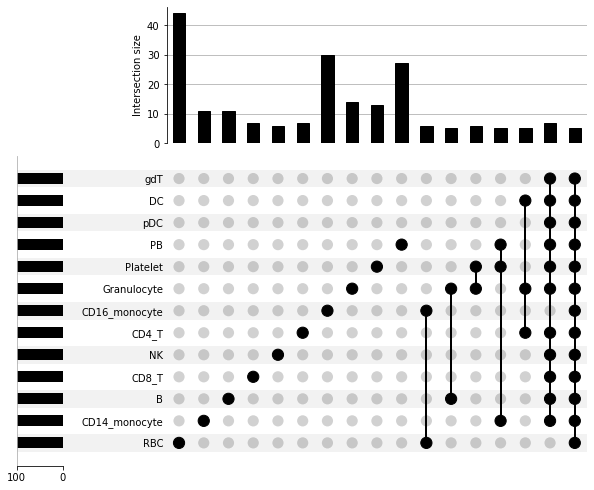

In [150]:
from scipy.stats import rankdata


top_lim = 100

top_genes = {}
de_genes_all = None
for curr_cell_type in Y_full.columns:


    # this is for the "projected" expression
    curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
    proj_ctrl = decoded_0_0[curr_idx]
    proj_stim = decoded_0_1[curr_idx]

    # take the median for nomalization

    proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
    proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
    #proj_ctrl = np.median(proj_ctrl, axis=0)
    #proj_stim = np.median(proj_stim, axis=0)
    proj_log2FC = np.abs(proj_stim-proj_ctrl)

    # make into DF
    proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)

    intersect_proj = proj_log2FC_df.loc[union_genes][0]
    top_proj_genes = intersect_proj.index[np.argsort(np.abs(intersect_proj))].tolist()[::-1][0:top_lim]

    top_genes[curr_cell_type] = top_proj_genes


cell_diff = from_contents(top_genes)
ax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()

#venn2([set(top_pub_genes), set(top_proj_genes)], set_labels = ('Top Pub Genes', 'Top Proj Genes'))
#plt.show()


In [151]:
top_genes["CD4_T"]

['IFI27',
 'SIGLEC1',
 'RSAD2',
 'SELENBP1',
 'IFI44L',
 'IFI44',
 'EPB42',
 'PDZK1IP1',
 'EPSTI1',
 'STRADB',
 'CMPK2',
 'OASL',
 'SNCA',
 'SLC6A8',
 'KRT1',
 'IFIT1',
 'IGKV1-5',
 'OSBP2',
 'SPTB',
 'TNS1',
 'TESC',
 'TUBB2A',
 'NFIX',
 'IGF2BP2',
 'OPTN',
 'IGHA1',
 'BCL2A1',
 'PI3',
 'MKI67',
 'SLC4A1',
 'ISG15',
 'DDX60',
 'HERC5',
 'SLC31A2',
 'XAF1',
 'RFX2',
 'OAS2',
 'IGKV4-1',
 'KREMEN1',
 'BIN2',
 'MXI1',
 'IFI6',
 'IGLL5',
 'MT-RNR1',
 'FECH',
 'VWCE',
 'OTOF',
 'IGHV3-30',
 'TBC1D17',
 'IGLV2-14',
 'TSPAN5',
 'LGALS3',
 'IGHA2',
 'HCP5',
 'TMOD1',
 'OAS1',
 'ANK1',
 'IGKV1D-39',
 'MT2A',
 'OAS3',
 'OR2W3',
 'IFIT5',
 'EMC3',
 'IMPA2',
 'CCDC97',
 'CNTNAP3',
 'IGLC3',
 'WDR45',
 'ATF4',
 'TRIM58',
 'JUP',
 'MPZL1',
 'PLSCR1',
 'IGKV3-20',
 'HERC6',
 'IGLC2',
 'HAGH',
 'MBNL3',
 'TRIM14',
 'MZB1',
 'ZCCHC2',
 'HBQ1',
 'CDC42EP2',
 'FAM210B',
 'CD38',
 'GLRX5',
 'GMPR',
 'CCNJL',
 'RPPH1',
 'TXNDC5',
 'GPR146',
 'SMIM1',
 'S100A6',
 'NT5C3A',
 'RHOA',
 'AOC3',
 'BLVRB',
 'REC

In [122]:
de_genes_all = None
cell_type_interest = "gdT"
for curr_cell_type in Y_full.columns:
    if curr_cell_type == cell_type_interest:
        continue

    top_proj_genes = top_genes[curr_cell_type]
    if de_genes_all is None:
        de_genes_all = top_proj_genes
    else:
        de_genes_all = np.union1d(de_genes_all, top_proj_genes)

ct_specific = np.setdiff1d(top_genes[cell_type_interest], de_genes_all)
ct_specific.tolist()


['EIF3F', 'PLB1']

In [168]:
from sklearn.metrics import r2_score, explained_variance_score, mean_squared_error

def plot_effect_size_corr(xval, yval, ax, title, xlab, ylab, class_id, style_id, alpha=0.5):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id,
        alpha= alpha,
        style=style_id
    )
    #g.set(ylim=(min_val, max_val))
    #g.set(xlim=(min_val, max_val))
    #g.plot([min_val, max_val], [min_val, max_val], transform=g.transAxes)
    sns.set_palette("Accent")

    ax.set_title(title)
    return g


<ipython-input-182-136fcc01ea40>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
<ipython-input-182-136fcc01ea40>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"
<ipython-input-182-136fcc01ea40>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.

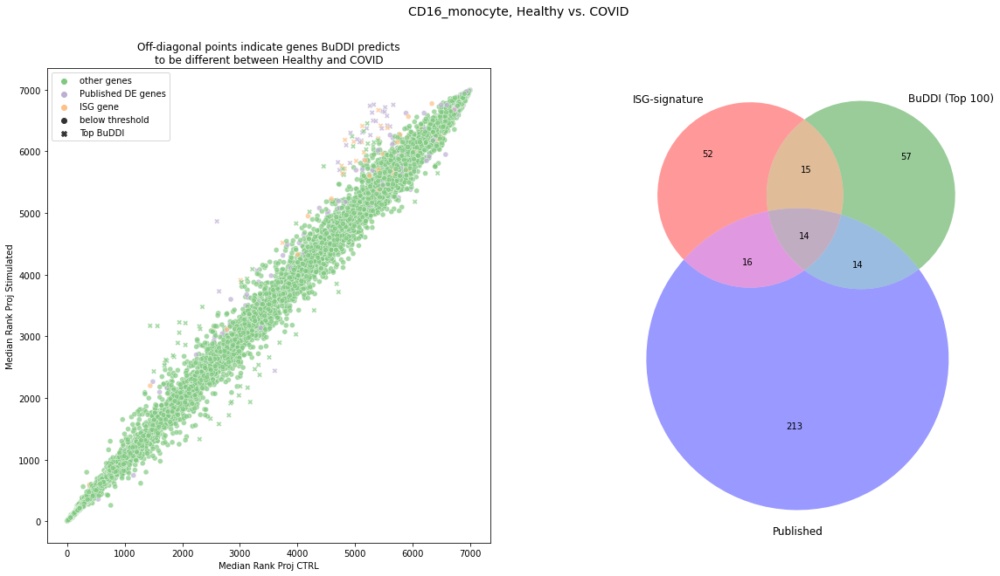

In [182]:
from matplotlib_venn import venn3
sns.set_palette("Accent")

curr_cell_type = "CD16_monocyte"

top_lim = 100

ISG_genes = ["ADAR", "B2M", "BATF2", "BST2", "C1S", "CASP1", "CASP8", "CCRL2", "CD47", "CD74", "CMPK2", "CMTR1", "CNP", "CSF1", "CXCL10", "CXCL11", "DDX60", "DHX58", "EIF2AK2", "ELF1", "EPSTI1", "GBP2", "GBP4", "GMPR", "HELZ2", "HERC6", "HLA-C", "IFI27", "IFI30", "IFI35", "IFI44", "IFI44L", "IFIH1", "IFIT2", "IFIT3", "IFITM1", "IFITM2", "IFITM3", "IL15", "IL4R", "IL7", "IRF1", "IRF2", "IRF7", "IRF9", "ISG15", "ISG20", "LAMP3", "LAP3", "LGALS3BP", "LPAR6", "LY6E", "MOV10", "MVB12A", "MX1", "NCOA7", "NMI", "NUB1", "OAS1", "OASL", "OGFR", "PARP12", "PARP14", "PARP9", "PLSCR1", "PNPT1", "PROCR", "PSMA3", "PSMB8", "PSMB9", "PSME1", "PSME2", "RIPK2", "RNF31", "RSAD2", "RTP4", "SAMD9", "SAMD9L", "SELL", "SLC25A28", "SP110", "STAT2", "TAP1", "TDRD7", "TENT5A", "TMEM140", "TRAFD1", "TRIM14", "TRIM21", "TRIM25", "TRIM26", "TRIM5", "TXNIP", "UBA7", "UBE2L6", "USP18", "WARS1"]
HLA_genes = ["HLA-DMA", "HLA-DMB", "HLA-DOA", "HLA-DOB", "HLA-DPA1", "HLA-DPB1", "HLA-DQA1", "HLA-DQA2", "HLA-DQB1", "HLA-DQB1-AS1", "HLA-DQB2", "HLA-DRA", "HLA-DRB1", "HLA-DRB5"]
TCell_genes = ["KIAA1671", "ABI3", "ADAM19", "AKNA", "ARHGAP9", "ARL6IP1", "ARMC7", "BCL2A1", "CBX4", "CCL3", "CCL4", "CCL5", "CD160", "CD164", "CD27", "CD3E", "CD3G", "CD7", "CD82", "CD8A", "CST7", "CXCR6", "DAPK2", "DTX1", "DUSP2", "EFHD2", "EIF4A2", "FAM189B", "FASLG", "FOXN3", "FYN", "GIMAP1", "GIMAP6", "GIMAP7", "GLRX", "GNG2", "GRAMD1A", "GZMA", "GZMB", "GZMK", "HLA-A", "HCST", "HSPA5", "ID2", "IFIT3", "IL21R", "ISG15", "ITK", "ITPKB", "LAG3", "LAX1", "LRRK1", "MBNL1", "MXD4", "NR4A2", "PDCD1", "PFDN5", "PLA2G16", "PLAC8", "PRDX5", "PRKCH", "PSMB10", "PSMB8", "PSME1", "PTGER4", "PTPN18", "PTPN22", "RGS1", "RGS2", "RGS3", "RTP4", "RUNX3", "SH2D2A", "SHISA5", "SIPA1", "SLC3A2", "STAT1", "STK17B", "TAP2", "TAPBP", "TAPBPL", "TNFRSF1B", "TOX", "UCP2", "VMP1", "ZBP1"]
Pub_DE = ["ABCA1", "AC009501.4", "AC104809.4", "ACTG1", "ADM", "AHNAK", "AKAP13", "ALDH2", "ANKRD22", "APLP2", "APOBEC3A", "APOBEC3B", "APP", "AQP9", "ARHGAP31", "ATP1B1", "ATP2B1", "B2M", "BHLHE40", "BLVRB", "C1orf54", "C1orf63", "C1QA", "C1QB", "C1QC", "C3AR1", "C5AR1", "CCNI", "CCR1", "CD14", "CD163", "CD209", "CD300E", "CD36", "CD63", "CD72", "CD74", "CD84", "CD93", "CDCP1", "CDKN1A", "CDKN1C", "CFL1", "CLU", "CMKLR1", "CMPK2", "COTL1", "CPVL", "CREG1", "CTSA", "CTSB", "CTSD", "CTSL", "CX3CR1", "CXCL10", "CYBB", "CYFIP1", "DAB2", "DDX17", "DDX5", "DRAM1", "DTX3L", "DYSF", "EEF1A1", "EEF2", "EHD4", "EIF1", "EIF3C", "EIF4B", "EMP1", "ENTPD6", "EPB41L2", "EPSTI1", "ERAP2", "ERLIN2", "F13A1", "FADS1", "FAM129A", "FCGR1A", "FCGR1B", "FCN1", "FFAR2", "FOLR2", "FPR1", "FPR3", "FTL", "GADD45B", "GBP1", "GBP2", "GBP4", "GBP5", "GIMAP4", "GIMAP5", "GLB1", "GLUL", "GNB2L1", "GNS", "GPNMB", "GPX1", "GRN", "GSTM1", "HBB", "HELZ2", "HERC5", "HLA-A", "HLA-B", "HLA-DQA1", "HLA-DQA2", "HLA-DRB5", "HLA-E", "HNRNPA2B1", "HSP90AA1", "HSP90AB1", "HSPA1A", "HSPB1", "HSPH1", "IDH1", "IFI27", "IFI44", "IFI44L", "IFI6", "IFIH1", "IFIT1", "IFIT3", "IFITM1", "IFITM3", "IGHG1", "IGHG2", "IGHG4", "IGHM", "IGLC3", "IL1B", "IRF1", "ISG15", "ITGAM", "KCTD12", "LAMP2", "LAP3", "LGALS3BP", "LGMN", "LHFPL2", "LILRA3", "LILRB4", "LINC00963", "LITAF", "LMNA", "LMNB1", "LST1", "LTA4H", "LYST", "LYVE1", "LYZ", "MARCO", "MERTK", "METTL7B", "MNDA", "MPP1", "MRC1", "MS4A4A", "MS4A6A", "MS4A7", "MSR1", "MT2A", "MX1", "MX2", "NACA", "NAIP", "NAP1L1", "NCF1", "NINJ1", "NR1H3", "NT5C3A", "OAS2", "OAS3", "OASL", "OTOF", "PABPC1", "PARP14", "PARP9", "PDK4", "PIM1", "PLAC8", "PLBD1", "PLSCR1", "PSME2", "PTP4A2", "PTPRC", "RABGAP1L", "RBM47", "RGL1", "RIT1", "RNASE1", "RNASE2", "RNASE6", "RP11-8L8.2", "RSAD2", "S100A8", "S100A9", "SAMD9", "SAMD9L", "SASH1", "SCARB2", "SCD", "SCO2", "SDC3", "SEC24D", "SERPING1", "SGK1", "SIGLEC1", "SIGLEC10", "SIRPA", "SLAMF7", "SLC11A1", "SLC25A6", "SLC39A8", "SLC40A1", "SMAP2", "SOCS3", "SPATA31E1", "SPATS2L", "SPIC", "SPN", "SRRM2", "STAB1", "STAT1", "TAP1", "TAP2", "TCN2", "TFEC", "TIMP1", "TLR7", "TMEM123", "TMEM176B", "TMEM2", "TMSB10", "TMSB4X", "TNFAIP3", "TNFRSF1B", "TNFSF10", "TPM4", "TPP1", "TPT1", "TREM2", "TRIM69", "TSC22D3", "TYMP", "UBC", "UBE2L6", "UTRN", "VAMP5", "VCAN", "VMO1", "VSIG4", "WARS", "XAF1", "ZFAND5", "ZNF217"]

# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes, top_proj_genes))[0]] = "Top BuDDI"

fig, axs = plt.subplots(1, 2, figsize=(20,10))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Healthy and COVID", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(ISG_genes), set(top_proj_genes), set(Pub_DE)], set_labels = ("ISG-signature", 'BuDDI (Top 100)', 'Published'), ax=axs[1])


fig.suptitle(f"{curr_cell_type}, Healthy vs. COVID", fontsize=14)

fig.show()

<ipython-input-176-fac8d4e26f33>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
<ipython-input-176-fac8d4e26f33>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"
<ipython-input-176-fac8d4e26f33>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.

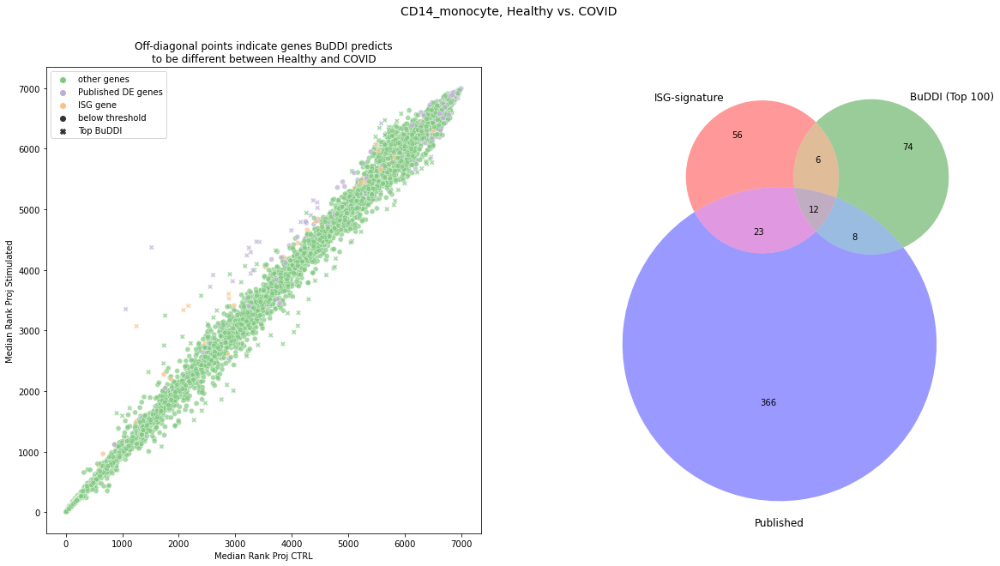

In [176]:

curr_cell_type = "CD14_monocyte"

Pub_DE = ["AC009501.4", "ACSL1", "ACTB", "ACTG1", "ACTR2", "ACTR3", "ADAM10", "ADAR", "AGFG1", "AHNAK", "AIF1", "AIM1", "ALDH1A1", "ALDH2", "AMICA1", "ANPEP", "ANXA2", "ANXA6", "AP1S2", "APLP2", "APOBEC3A", "APOBR", "APP", "AQP9", "ARHGAP30", "ARPC5", "ARRB2", "ASAH1", "ASGR2", "B2M", "B4GALT5", "BCAS4", "BCL2A1", "BLVRA", "BNIP3L", "BRI3", "BTF3", "BTG1", "BTG2", "C10orf54", "C19orf59", "C1orf63", "CALM1", "CALM2", "CALM3", "CALR", "CAP1", "CAPN2", "CCND3", "CCNI", "CCNL1", "CCR1", "CCR2", "CD14", "CD163", "CD300E", "CD36", "CD4", "CD44", "CD52", "CD53", "CD55", "CD63", "CD74", "CDC42EP3", "CEBPD", "CECR1", "CES1", "CFD", "CFL1", "CFP", "CKAP4", "CLEC12A", "CLTC", "CLU", "CMPK2", "CNPY3", "COTL1", "CPVL", "CR1", "CRTAP", "CSF1R", "CSF3R", "CST3", "CTNNA1", "CTSA", "CTSB", "CTSD", "CTSH", "CTSS", "CUL1", "CYBB", "CYP1B1", "DDX17", "DDX3X", "DDX5", "DDX60", "DDX60L", "DMXL2", "DNAJA1", "DOK2", "DTX3L", "DUSP1", "DUSP6", "DYSF", "EEF1A1", "EEF1B2", "EEF2", "EGR1", "EIF1", "EIF2AK2", "EIF3C", "EIF3H", "EIF3L", "EIF4A2", "EIF4B", "EIF5", "EMILIN2", "EMP1", "ENO1", "EPSTI1", "ERP29", "EVI2A", "EVI2B", "EZR", "F13A1", "F5", "FAM101B", "FAM129A", "FAM198B", "FAM20A", "FAM65B", "FCGR1A", "FCGR1B", "FCGR3A", "FCGRT", "FCN1", "FGL2", "FGR", "FKBP5", "FOLR3", "FOS", "FOSB", "FPR1", "FPR2", "FTL", "FYB", "GAPDH", "GBP1", "GBP2", "GCA", "GLTSCR2", "GLUL", "GNAS", "GNB2L1", "GNS", "GRB2", "GRN", "GSTK1", "GSTO1", "GSTP1", "H1F0", "H2AFY", "H3F3B", "HBB", "HIP1", "HIST1H1D", "HIST1H1E", "HLA-A", "HLA-B", "HLA-C", "HLA-DMA", "HLA-DMB", "HLA-DPA1", "HLA-DPB1", "HLA-DQA1", "HLA-DQB1", "HLA-DRA", "HLA-DRB1", "HLA-DRB5", "HLA-E", "HLA-F", "HMGN2", "HNRNPDL", "HP", "HSP90AA1", "HSP90AB1", "HSP90B1", "HSPA5", "HSPA8", "ICAM3", "IDH1", "IER2", "IER5", "IFI16", "IFI27", "IFI44", "IFI44L", "IFI6", "IFIH1", "IFIT1", "IFIT2", "IFIT3", "IFITM2", "IFITM3", "IGHG1", "IGHG4", "IGHM", "IGJ", "IGLC2", "IGLC3", "IKZF1", "IL17RA", "IL1RN", "IL6R", "IL8", "IQGAP1", "IRF1", "IRF7", "IRS2", "ISG15", "ITGAM", "ITGAX", "ITGB2", "ITM2B", "JMJD1C", "JUN", "JUNB", "KLF10", "KLF4", "KLF6", "LAP3", "LAPTM5", "LCP1", "LDHA", "LDLR", "LGALS1", "LGALS2", "LGALS3BP", "LGALS9", "LMNB1", "LRP1", "LRRK2", "LSP1", "LST1", "LTA4H", "LY6E", "LYZ", "MAFB", "MAP3K3", "MAPK14", "MARCH1", "MARCKS", "MCL1", "METTL9", "MIS18BP1", "MKI67", "MNDA", "MPEG1", "MPO", "MS4A4A", "MS4A7", "MX1", "MX2", "MYD88", "MYH9", "MYL6", "MYO1F", "MYO9B", "MYOF", "NACA", "NAGK", "NAIP", "NAMPT", "NAMPTL", "NAP1L1", "NBPF10", "NCF1", "NCF2", "NCL", "NEAT1", "NFKBIA", "NLRP1", "NOTCH2", "OAS1", "OAS2", "OAS3", "OASL", "OGFRL1", "OTOF", "OTUD1", "PABPC1", "PABPC4", "PARP14", "PARP9", "PCBP2", "PDIA3", "PFDN5", "PGD", "PGK1", "PILRA", "PIM1", "PIM3", "PKM", "PLAC8", "PLBD1", "PLEKHO1", "PLSCR1", "PNISR", "PNRC1", "POU2F2", "PPP1R15A", "PSAP", "PTAFR", "PTMA", "PTP4A2", "RAB31", "RBM3", "RBM39", "RETN", "RGS2", "RNASE1", "RNASE2", "RNASET2", "RNF213", "RRBP1", "RSAD2", "RSL1D1", "S100A10", "S100A12", "S100A4", "S100A6", "S100A8", "S100A9", "SAMD9", "SAMD9L", "SAT1", "SCO2", "SELL", "SEPT9", "SERF2", "SERPINA1", "SERPINB1", "SGK1", "SIGLEC1", "SLC25A6", "SLC2A3", "SLC39A8", "SLC7A7", "SLFN5", "SMAP2", "SNHG5", "SOCS3", "SOD2", "SORL1", "SORT1", "SP100", "SP110", "SPARC", "SPTLC2", "SRGN", "SRRM2", "SRSF5", "STAB1", "STAT1", "SULF2", "TGFBI", "THBS1", "TKT", "TLE3", "TLR2", "TMEM123", "TMEM176B", "TMEM66", "TMPO", "TMSB10", "TMSB4X", "TNFAIP2", "TNFAIP3", "TNFRSF1B", "TNFSF13B", "TPI1", "TPM3", "TPM4", "TPT1", "TRIM22", "TSC22D3", "TSPO", "TXNIP", "TYMP", "TYROBP", "UBA52", "UBC", "UBE2J1", "USP15", "VCAN", "VIM", "VNN2", "VPS13C", "WARS", "WSB1", "XAF1", "YBX3", "YWHAG", "ZFAS1", "ZFP36", "ZFP36L1", "ZFP36L2", "ZNF106"]

top_lim = 100


# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes, top_proj_genes))[0]] = "Top BuDDI"

fig, axs = plt.subplots(1, 2, figsize=(20,10))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Healthy and COVID", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(ISG_genes), set(top_proj_genes), set(Pub_DE)], set_labels = ("ISG-signature", 'BuDDI (Top 100)', 'Published'), ax=axs[1])


fig.suptitle(f"{curr_cell_type}, Healthy vs. COVID", fontsize=14)

fig.show()

<ipython-input-183-37f669ef714c>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
<ipython-input-183-37f669ef714c>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"
<ipython-input-183-37f669ef714c>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.

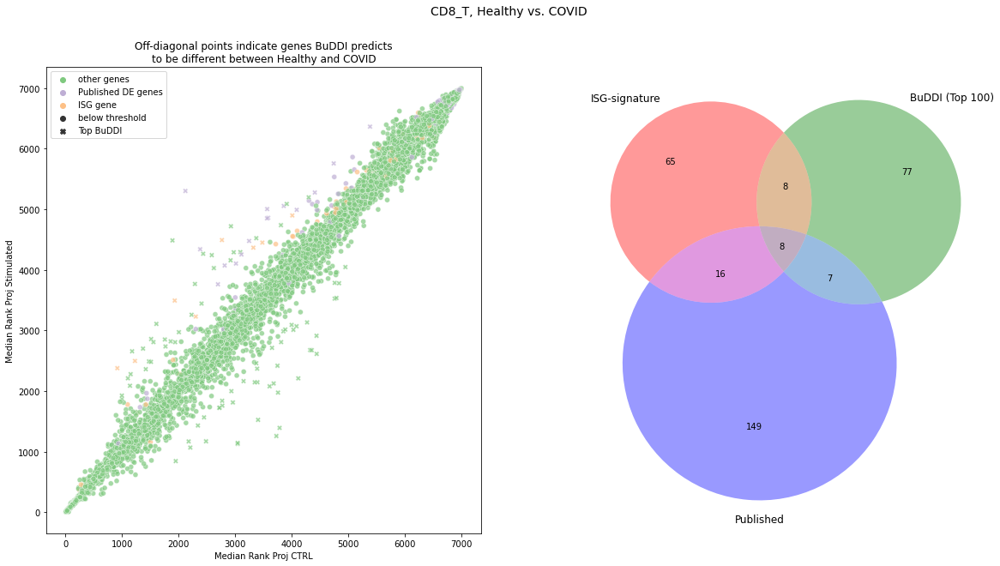

In [183]:

curr_cell_type = "CD8_T"

Pub_DE = ["AC009501.4", "ACTB", "ACTG1", "ADAR", "AHNAK", "AKNA", "ANKRD12", "ARL4C", "ARPC2", "ATM", "ATRX", "B2M", "BCAS4", "BCL2", "BIN2", "BTG1", "CALM1", "CALR", "CCDC69", "CCL5", "CCND2", "CCNL1", "CCR5", "CD247", "CD38", "CD52", "CD8A", "CD8B", "CDC42SE2", "CENPF", "COTL1", "CX3CR1", "DDX17", "DDX5", "DDX60", "DNAJA1", "DTX3L", "EEF1A1", "EEF1B2", "EEF1D", "EEF2", "EIF1", "EIF2AK2", "EIF4B", "ENO1", "EPSTI1", "ERAP2", "ETS1", "FGFBP2", "FGFR1", "FGL2", "GAPDH", "GBP1", "GBP5", "GIMAP4", "GIMAP7", "GLTSCR2", "GNB2L1", "GNLY", "GOLGA8A", "GOLGA8B", "GPR56", "GZMA", "HBA2", "HBB", "HIST1H1C", "HIST1H4C", "HLA-A", "HLA-B", "HLA-C", "HLA-E", "HLA-F", "HMGB2", "HMGN2", "HNRNPA2B1", "HSP90AA1", "HSP90AB1", "HSPA5", "HSPA8", "HSPD1", "HSPH1", "IFI16", "IFI27", "IFI44", "IFI44L", "IFI6", "IFIT1", "IFIT3", "IFITM1", "IGHG1", "IGHG2", "IGHM", "IGLC2", "IGLC3", "IL7R", "IQGAP1", "ISG15", "ISG20", "ITGAL", "ITM2A", "JAK1", "JUN", "JUNB", "KIAA1551", "KLF13", "KLF2", "KLF6", "LAG3", "LCP1", "LDHA", "LGALS1", "LITAF", "LMNB1", "LUC7L3", "MBNL1", "MCM4", "MCM7", "MKI67", "MX1", "MX2", "MYOM2", "NACA", "NFKBIA", "NKG7", "OAS1", "OAS2", "OAS3", "P2RY8", "PABPC1", "PARP14", "PARP9", "PFDN5", "PLEK", "PLSCR1", "PNRC1", "PPP2R5C", "PSMB9", "PSME2", "PTMA", "RBL2", "RNF213", "RP1-17K7.2", "RSAD2", "RUNX3", "S100A8", "S100A9", "SAMD9", "SAMD9L", "SFPQ", "SH2D1A", "SLC25A6", "SLFN5", "SMC4", "SP100", "SPN", "SPOCK2", "STAT1", "STIP1", "STMN1", "SYNE1", "SYNE2", "TCF7", "TMSB4X", "TNFAIP3", "TOP2A", "TPT1", "TPX2", "TRAC", "TRBC2", "TRGC1", "TRIM22", "TSC22D3", "TUBB", "TXNIP", "UBA52", "VIM", "XAF1", "ZFP36L2", "ZNF683", "ZNRD1-AS1"]
#Pub_DE = ["XAF1", "MKI67", "S100A8", "TPT1", "MX1", "EEF1A1", "STAT1", "S100A9", "IFI44L", "GNB2L1", "FGFBP2", "GNLY", "HLA-E", "OAS2", "ADAR", "EIF4B", "EEF2", "HLA-C", "HLA-B", "PABPC1", "OAS3", "GLTSCR2", "ACTB", "AHNAK", "PLEK", "PARP9", "TOP2A", "IFIT3", "EIF2AK2", "HBB", "ISG15", "IGLC3", "SP100", "B2M", "IFI6", "IFI44", "AC009501.4", "TRBC2", "HIST1H4C", "HMGB2", "TMSB4X", "CCL5", "CX3CR1", "EEF1D", "NACA", "MCM4", "SAMD9L", "IGHM", "SYNE1", "PARP14"]


TCell_genes = ["KIAA1671", "ABI3", "ADAM19", "AKNA", "ARHGAP9", "ARL6IP1", "ARMC7", "BCL2A1", "CBX4", "CCL3", "CCL4", "CCL5", "CD160", "CD164", "CD27", "CD3E", "CD3G", "CD7", "CD82", "CD8A", "CST7", "CXCR6", "DAPK2", "DTX1", "DUSP2", "EFHD2", "EIF4A2", "FAM189B", "FASLG", "FOXN3", "FYN", "GIMAP1", "GIMAP6", "GIMAP7", "GLRX", "GNG2", "GRAMD1A", "GZMA", "GZMB", "GZMK", "HLA-A", "HCST", "HSPA5", "ID2", "IFIT3", "IL21R", "ISG15", "ITK", "ITPKB", "LAG3", "LAX1", "LRRK1", "MBNL1", "MXD4", "NR4A2", "PDCD1", "PFDN5", "PLA2G16", "PLAC8", "PRDX5", "PRKCH", "PSMB10", "PSMB8", "PSME1", "PTGER4", "PTPN18", "PTPN22", "RGS1", "RGS2", "RGS3", "RTP4", "RUNX3", "SH2D2A", "SHISA5", "SIPA1", "SLC3A2", "STAT1", "STK17B", "TAP2", "TAPBP", "TAPBPL", "TNFRSF1B", "TOX", "UCP2", "VMP1", "ZBP1"]
Pub_DE = ["AC009501.4", "ACTB", "ACTG1", "ADAR", "AHNAK", "AKNA", "ANKRD12", "ARL4C", "ARPC2", "ATM", "ATRX", "B2M", "BCAS4", "BCL2", "BIN2", "BTG1", "CALM1", "CALR", "CCDC69", "CCL5", "CCND2", "CCNL1", "CCR5", "CD247", "CD38", "CD52", "CD8A", "CD8B", "CDC42SE2", "CENPF", "COTL1", "CX3CR1", "DDX17", "DDX5", "DDX60", "DNAJA1", "DTX3L", "EEF1A1", "EEF1B2", "EEF1D", "EEF2", "EIF1", "EIF2AK2", "EIF4B", "ENO1", "EPSTI1", "ERAP2", "ETS1", "FGFBP2", "FGFR1", "FGL2", "GAPDH", "GBP1", "GBP5", "GIMAP4", "GIMAP7", "GLTSCR2", "GNB2L1", "GNLY", "GOLGA8A", "GOLGA8B", "GPR56", "GZMA", "HBA2", "HBB", "HIST1H1C", "HIST1H4C", "HLA-A", "HLA-B", "HLA-C", "HLA-E", "HLA-F", "HMGB2", "HMGN2", "HNRNPA2B1", "HSP90AA1", "HSP90AB1", "HSPA5", "HSPA8", "HSPD1", "HSPH1", "IFI16", "IFI27", "IFI44", "IFI44L", "IFI6", "IFIT1", "IFIT3", "IFITM1", "IGHG1", "IGHG2", "IGHM", "IGLC2", "IGLC3", "IL7R", "IQGAP1", "ISG15", "ISG20", "ITGAL", "ITM2A", "JAK1", "JUN", "JUNB", "KIAA1551", "KLF13", "KLF2", "KLF6", "LAG3", "LCP1", "LDHA", "LGALS1", "LITAF", "LMNB1", "LUC7L3", "MBNL1", "MCM4", "MCM7", "MKI67", "MX1", "MX2", "MYOM2", "NACA", "NFKBIA", "NKG7", "OAS1", "OAS2", "OAS3", "P2RY8", "PABPC1", "PARP14", "PARP9", "PFDN5", "PLEK", "PLSCR1", "PNRC1", "PPP2R5C", "PSMB9", "PSME2", "PTMA", "RBL2", "RNF213", "RP1-17K7.2", "RSAD2", "RUNX3", "S100A8", "S100A9", "SAMD9", "SAMD9L", "SFPQ", "SH2D1A", "SLC25A6", "SLFN5", "SMC4", "SP100", "SPN", "SPOCK2", "STAT1", "STIP1", "STMN1", "SYNE1", "SYNE2", "TCF7", "TMSB4X", "TNFAIP3", "TOP2A", "TPT1", "TPX2", "TRAC", "TRBC2", "TRGC1", "TRIM22", "TSC22D3", "TUBB", "TXNIP", "UBA52", "VIM", "XAF1", "ZFP36L2", "ZNF683", "ZNRD1-AS1"]
#Pub_DE = ["XAF1", "IFI44L", "PIM1", "MX1", "TPT1", "S100A8", "SOCS3", "IL7R", "S100A9", "EEF2", "IFIT3", "PABPC1", "GOLGA8A", "GLTSCR2", "DDX17", "EEF1A1", "LUC7L3", "TXNIP", "ADAR", "AC009501.4", "STAT1", "GNB2L1", "OAS2", "NFKBIA", "EIF2AK2", "IFI44", "RNF213", "ISG15", "MYC", "EIF4B", "IGLC3", "IFI27", "UBA52", "ATHL1", "GOLGA8B", "ZFP36L2", "SP100", "LTB", "PARP9", "MX2", "SAMD9L", "DDX60", "TRIM22", "FOS", "HBB", "GPRIN3", "STK17B", "SRSF5", "EEF1B2", "OAS3", "ACTG1", "HLA-E", "HSP90AA1", "IFI16", "H3F3B", "NFKBIZ", "AHNAK", "ARID5B", "IGHM", "IFI6", "HLA-C", "IL6ST", "VCAN", "KLF6", "TMSB4X", "GIMAP7", "TCF7", "TRBC2", "PARP14", "LYZ", "ETS1", "TTN", "PNISR", "CHD3", "LDHB", "TSC22D3", "LCP1", "SMCHD1", "HERC6", "PRDM1", "UBALD2", "IGHG1", "LBH", "SORL1", "IFITM3", "CCNL1", "HSPA8", "SLC25A6", "PFDN5", "HSPA5", "PSAP", "HSP90AB1", "RSAD2", "RP1-17K7.2", "ACTB", "BTG1", "ATM", "NOSIP", "XBP1", "IFIT1"]


top_lim = 100


# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes, top_proj_genes))[0]] = "Top BuDDI"

fig, axs = plt.subplots(1, 2, figsize=(20,10))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Healthy and COVID", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(ISG_genes), set(top_proj_genes), set(Pub_DE)], set_labels = ("ISG-signature", 'BuDDI (Top 100)', 'Published'), ax=axs[1])


fig.suptitle(f"{curr_cell_type}, Healthy vs. COVID", fontsize=14)

fig.show()


<ipython-input-184-3114295e87df>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
<ipython-input-184-3114295e87df>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"
<ipython-input-184-3114295e87df>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.

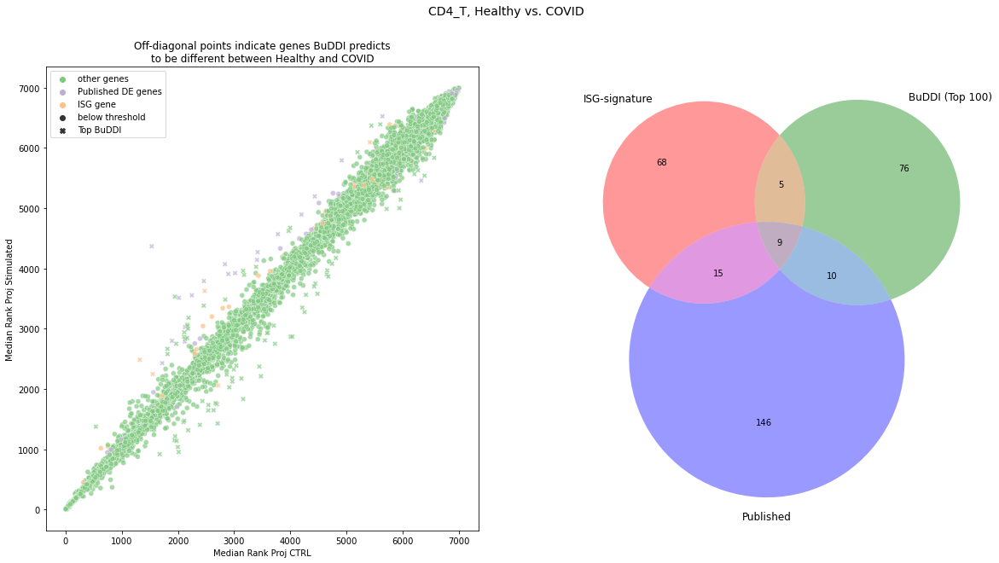

In [184]:
top_lim = 100

curr_cell_type = "CD4_T"

TCell_genes = ["KIAA1671", "ABI3", "ADAM19", "AKNA", "ARHGAP9", "ARL6IP1", "ARMC7", "BCL2A1", "CBX4", "CCL3", "CCL4", "CCL5", "CD160", "CD164", "CD27", "CD3E", "CD3G", "CD7", "CD82", "CD8A", "CST7", "CXCR6", "DAPK2", "DTX1", "DUSP2", "EFHD2", "EIF4A2", "FAM189B", "FASLG", "FOXN3", "FYN", "GIMAP1", "GIMAP6", "GIMAP7", "GLRX", "GNG2", "GRAMD1A", "GZMA", "GZMB", "GZMK", "HLA-A", "HCST", "HSPA5", "ID2", "IFIT3", "IL21R", "ISG15", "ITK", "ITPKB", "LAG3", "LAX1", "LRRK1", "MBNL1", "MXD4", "NR4A2", "PDCD1", "PFDN5", "PLA2G16", "PLAC8", "PRDX5", "PRKCH", "PSMB10", "PSMB8", "PSME1", "PTGER4", "PTPN18", "PTPN22", "RGS1", "RGS2", "RGS3", "RTP4", "RUNX3", "SH2D2A", "SHISA5", "SIPA1", "SLC3A2", "STAT1", "STK17B", "TAP2", "TAPBP", "TAPBPL", "TNFRSF1B", "TOX", "UCP2", "VMP1", "ZBP1"]
Pub_DE = ["AC009501.4", "ACTB", "ACTG1", "ADAR", "AHNAK", "AKNA", "ANKRD12", "ARL4C", "ARPC2", "ATM", "ATRX", "B2M", "BCAS4", "BCL2", "BIN2", "BTG1", "CALM1", "CALR", "CCDC69", "CCL5", "CCND2", "CCNL1", "CCR5", "CD247", "CD38", "CD52", "CD8A", "CD8B", "CDC42SE2", "CENPF", "COTL1", "CX3CR1", "DDX17", "DDX5", "DDX60", "DNAJA1", "DTX3L", "EEF1A1", "EEF1B2", "EEF1D", "EEF2", "EIF1", "EIF2AK2", "EIF4B", "ENO1", "EPSTI1", "ERAP2", "ETS1", "FGFBP2", "FGFR1", "FGL2", "GAPDH", "GBP1", "GBP5", "GIMAP4", "GIMAP7", "GLTSCR2", "GNB2L1", "GNLY", "GOLGA8A", "GOLGA8B", "GPR56", "GZMA", "HBA2", "HBB", "HIST1H1C", "HIST1H4C", "HLA-A", "HLA-B", "HLA-C", "HLA-E", "HLA-F", "HMGB2", "HMGN2", "HNRNPA2B1", "HSP90AA1", "HSP90AB1", "HSPA5", "HSPA8", "HSPD1", "HSPH1", "IFI16", "IFI27", "IFI44", "IFI44L", "IFI6", "IFIT1", "IFIT3", "IFITM1", "IGHG1", "IGHG2", "IGHM", "IGLC2", "IGLC3", "IL7R", "IQGAP1", "ISG15", "ISG20", "ITGAL", "ITM2A", "JAK1", "JUN", "JUNB", "KIAA1551", "KLF13", "KLF2", "KLF6", "LAG3", "LCP1", "LDHA", "LGALS1", "LITAF", "LMNB1", "LUC7L3", "MBNL1", "MCM4", "MCM7", "MKI67", "MX1", "MX2", "MYOM2", "NACA", "NFKBIA", "NKG7", "OAS1", "OAS2", "OAS3", "P2RY8", "PABPC1", "PARP14", "PARP9", "PFDN5", "PLEK", "PLSCR1", "PNRC1", "PPP2R5C", "PSMB9", "PSME2", "PTMA", "RBL2", "RNF213", "RP1-17K7.2", "RSAD2", "RUNX3", "S100A8", "S100A9", "SAMD9", "SAMD9L", "SFPQ", "SH2D1A", "SLC25A6", "SLFN5", "SMC4", "SP100", "SPN", "SPOCK2", "STAT1", "STIP1", "STMN1", "SYNE1", "SYNE2", "TCF7", "TMSB4X", "TNFAIP3", "TOP2A", "TPT1", "TPX2", "TRAC", "TRBC2", "TRGC1", "TRIM22", "TSC22D3", "TUBB", "TXNIP", "UBA52", "VIM", "XAF1", "ZFP36L2", "ZNF683", "ZNRD1-AS1"]
#Pub_DE = ["XAF1", "IFI44L", "PIM1", "MX1", "TPT1", "S100A8", "SOCS3", "IL7R", "S100A9", "EEF2", "IFIT3", "PABPC1", "GOLGA8A", "GLTSCR2", "DDX17", "EEF1A1", "LUC7L3", "TXNIP", "ADAR", "AC009501.4", "STAT1", "GNB2L1", "OAS2", "NFKBIA", "EIF2AK2", "IFI44", "RNF213", "ISG15", "MYC", "EIF4B", "IGLC3", "IFI27", "UBA52", "ATHL1", "GOLGA8B", "ZFP36L2", "SP100", "LTB", "PARP9", "MX2", "SAMD9L", "DDX60", "TRIM22", "FOS", "HBB", "GPRIN3", "STK17B", "SRSF5", "EEF1B2", "OAS3", "ACTG1", "HLA-E", "HSP90AA1", "IFI16", "H3F3B", "NFKBIZ", "AHNAK", "ARID5B", "IGHM", "IFI6", "HLA-C", "IL6ST", "VCAN", "KLF6", "TMSB4X", "GIMAP7", "TCF7", "TRBC2", "PARP14", "LYZ", "ETS1", "TTN", "PNISR", "CHD3", "LDHB", "TSC22D3", "LCP1", "SMCHD1", "HERC6", "PRDM1", "UBALD2", "IGHG1", "LBH", "SORL1", "IFITM3", "CCNL1", "HSPA8", "SLC25A6", "PFDN5", "HSPA5", "PSAP", "HSP90AB1", "RSAD2", "RP1-17K7.2", "ACTB", "BTG1", "ATM", "NOSIP", "XBP1", "IFIT1"]


top_lim = 100


# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes, top_proj_genes))[0]] = "Top BuDDI"

fig, axs = plt.subplots(1, 2, figsize=(20,10))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Healthy and COVID", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(ISG_genes), set(top_proj_genes), set(Pub_DE)], set_labels = ("ISG-signature", 'BuDDI (Top 100)', 'Published'), ax=axs[1])


fig.suptitle(f"{curr_cell_type}, Healthy vs. COVID", fontsize=14)

fig.show()


<ipython-input-179-880855b517e3>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
<ipython-input-179-880855b517e3>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"
<ipython-input-179-880855b517e3>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.

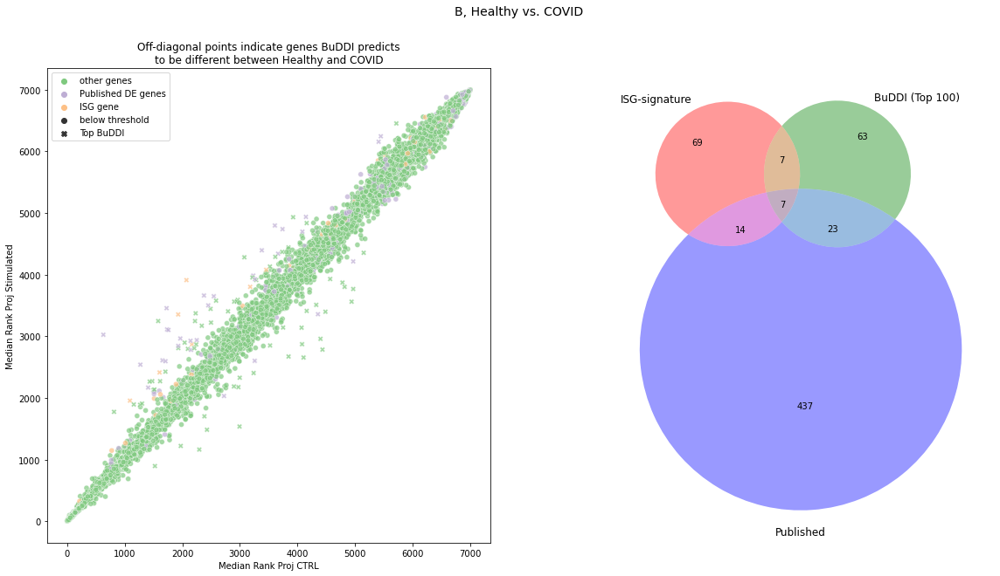

In [179]:
top_lim = 100

curr_cell_type = "B"

B_DE = ["IGHG4", "IGHG1", "S100A8", "IGHG2", "IGHG3", "HSP90B1", "S100A9", "IGJ", "IGLC3", "IGLC2", "CD74", "HSPA5", "MS4A1", "DEFA1B", "HLA-DRA", "HLA-DPB1", "XBP1", "IGHA1", "LTB", "MZB1", "IGHM", "HLA-DPA1", "HLA-DRB1", "SRGN", "PDIA4", "GLTSCR2", "EEF1A1", "MKI67", "LTF", "CALR", "CD79A", "IFI27", "RRBP1", "GNB2L1", "LYZ", "TXNIP", "DEFA3", "BANK1", "SEC11C", "ELL2", "LMAN1", "UBE2J1", "HLA-E", "PDIA6", "IGHA2", "ETS1", "MX1", "HDLBP", "MAN1A1", "PABPC1", "CCND2", "SWAP70", "CANX", "HLA-DQB1", "CD79B", "EEF2", "BTG1", "RPN2", "DEFA1", "SSR3", "CD52", "SPCS3", "VCAN", "ITM2C", "SLAMF7", "PTPRCAP", "IFI6", "AHNAK", "HBB", "OLFM4", "JAK1", "FAM46C", "P4HB", "CD38", "PNRC1", "HIST1H4C", "DDX5", "ISG15", "SSR4", "PTPRC", "PRKCB", "NAP1L1", "JUN", "TRAM1", "TSC22D3", "UBA52", "LAPTM5", "LDHA", "TPT1", "IFI44L", "TTN", "SUB1", "GAPDH", "EIF4B", "IL4R", "FAIM3", "MTDH", "HLA-DQA1", "RALGPS2", "IGKC"]
Pub_DE = ["CD74", "MS4A1", "HLA-DRA", "HLA-DPB1", "LTB", "HLA-DPA1", "HLA-DRB1", "GLTSCR2", "EEF1A1", "CD79A", "GNB2L1", "TXNIP", "BANK1", "HLA-E", "ETS1", "PABPC1", "SWAP70", "HLA-DQB1", "CD79B", "EEF2", "BTG1", "CD52", "PTPRCAP", "AHNAK", "JAK1", "PNRC1", "DDX5", "PTPRC", "PRKCB", "NAP1L1", "JUN", "TSC22D3", "UBA52", "LAPTM5", "TPT1", "TTN", "EIF4B", "IL4R", "FAIM3", "HLA-DQA1", "RALGPS2", "SLC25A6", "H3F3B", "FOXP1", "CD22", "SRSF5", "PAX5", "PFDN5", "BIRC3", "SMAP2", "FAM129C", "HLA-F", "TMSB4X", "DDX17", "CCNI", "AKAP13", "GOLGA8A", "EIF1", "EEF1D", "CIRBP", "UTRN", "HLA-DMB", "GNLY", "CXCR4", "FAM65B", "PNISR", "FCRL1", "NACA", "JUNB", "KLF6", "HLA-C", "RBM39", "DUSP1", "IRF8", "HLA-B", "MACF1", "HLA-DRB5", "TCL1A", "MYCBP2", "EEF1B2", "PLEKHA2", "GOLGA8B", "HLA-DOA", "ZFP36L2", "JMJD1C", "EZR", "KMT2A", "STX7", "ITSN2", "RCSD1", "MGEA5", "P2RX5", "VPS13C", "NFKBIA", "POU2F2", "NBPF10", "MARCH1", "IGHD", "ZFP36L1", "LINC00926", "HLA-DMA", "WDFY4", "SETD2", "CHD2", "SETX", "KMT2E", "HLA-A", "BPTF", "SRRM2", "SCAF11", "ARGLU1", "GAS5", "KIAA1551", "ANKRD12", "C1orf63", "JUND", "BOD1L1", "ATP2B1", "RASGRP2", "HNRNPDL", "CNTRL", "TNRC6B", "ATRX", "RP11-94L15.2", "CD37", "FCRLA", "SYK", "SPIB", "SNX2", "LUC7L3", "CD19", "MAP3K1", "PRDM2", "ATM", "ADAM28", "ORAI2", "DGKD", "C6orf48", "CIITA", "SEPT7", "FNBP1", "SF3B1", "ZNF318", "CAMK1D", "REL", "SRSF11", "SLC38A1", "BCL11A", "LBH", "TBC1D10C", "NIN", "SMC6", "SON", "IL24", "TAF7", "EIF3F", "TRBC2", "EVL", "HMHA1", "NKTR", "GGA2", "FAM107B", "GNAS", "ADD1", "CYFIP2", "FAU", "ADD3", "CTSS", "SYNE2", "LYN", "LRRFIP1", "FCRL3", "COX4I1", "PRRC2C", "ARID4B", "ACTR2", "FOS", "NIPBL", "MYH9", "PPP1R15A", "GRB2", "SMIM14", "ABLIM1", "CCNL1", "TCF4", "SP100", "MEF2C", "MTSS1", "EIF4A2", "CREBBP", "HNRNPA2B1", "BCAS4", "CHD7", "CYTH1", "FOSB", "DBNL", "BCL2", "CXXC5", "CFL1", "STK4", "TOMM7", "RP11-220I1.1", "FCRL5", "EIF3C", "PCF11", "SLC44A2", "ARHGAP30", "PTP4A2", "KDM4B", "TSPAN3", "ACTG1", "CD69", "CCDC88A", "PYGL", "MAPK14", "SEC14L1", "ERLIN1", "COX7A2", "FAR2", "PPIB", "AQP3", "FTL", "CST7", "ANLN", "SCD", "TACSTD2", "COL17A1", "TSPAN2", "SAMHD1", "TMEM258", "FNDC3B", "IRS2", "DNAJA1", "ATAD2", "KIAA1715", "RTN3", "TRAM2", "NLRC4", "APAF1", "WT1-AS", "TAP1", "ALOX5AP", "IGHJ4", "ATP2A2", "CTSD", "CDK6", "IFIT1", "PSME2", "APMAP", "SPN", "HSPH1", "OAS1", "RSAD2", "CLTC", "TOP1", "PRDX5", "ATP5A1", "SAMD9L", "CEACAM1", "PDZD8", "DDOST", "IGHV3-21", "CRISP3", "CENPF", "HDGF", "RAB27A", "ITGB1", "IGHV4-34", "HP", "RNASE3", "HM13", "PKM", "EDEM1", "IGHV4-59", "TP53INP1", "PGLYRP1", "EIF2AK2", "FBXO9", "ANP32E", "ACTB", "IGLV2-14", "C19orf59", "CEBPE", "RGL4", "HSP90AB1", "CENPE", "FAM46A", "MSRB1", "GCA", "ACTN1", "APOL6", "IGLV1-44", "APP", "GPI", "TNFSF10", "IGKV3-20", "TALDO1", "IL17RA", "TOP2A", "CD59", "SORT1", "ARG1", "PLBD1", "IGHV3-11", "IRF1", "IGLV6-57", "IGHV3-9", "RNASE2", "SERPINB10", "IGLV1-40", "SLPI", "SRPR", "DUSP6", "IGKV4-1", "MYL6", "HSPA8", "SERPINB1", "TCN1", "SEC61B", "RAB31", "B4GALT5", "TMED9", "VIM", "COPB2", "SMC4", "TYMP", "CHI3L1", "TMED10", "SND1", "YWHAE", "CALU", "IGLV3-10", "CPNE3", "PGD", "GSN", "EIF4G1", "HIST1H1D", "RETN", "H1F0", "UGCG", "GRN", "HSP90AA1", "IGHV3-7", "S100A12", "IFIT3", "ANXA3", "ENO1", "IFI44", "STOM", "FAM101B", "RP1-17K7.2", "HMGN2", "IGHV3-23", "TSPO", "ISG20", "ABCA13", "LAP3", "HBA2", "RNF213", "CAMP", "ANXA1", "STT3B", "OAS3", "CRELD2", "IGKV1D-39", "DNAJC3", "CD63", "STT3A", "SDF2L1", "CLPTM1L", "S100P", "CEACAM6", "PDIA3", "CKAP4", "FCN1", "WARS", "CTSG", "HSPD1", "IGLV3-19", "TRIB1", "ELANE", "CCR2", "MS4A3", "IGHJ6", "IFITM3", "IGLV5-45", "IGHV3-30", "RRM2", "TXNDC11", "PSAP", "AC009501.4", "IGKV1-39", "CEACAM8", "XAF1", "TKT", "IGHV3-33", "STAT1", "LMAN2", "ADAR", "MLEC", "IRF4", "SEL1L3", "MNDA", "NUCB2", "MPO", "VCP", "BPI", "OAS2", "SEC61A1", "SEL1L", "C19orf10", "ERLEC1", "DNAJB11", "PIM2", "RPN1", "LCN2", "SSR1", "MANF", "HYOU1", "MMP8", "PRDM1", "DEFA4", "IGKC", "MTDH", "GAPDH", "SUB1", "IFI44L", "LDHA", "TRAM1", "SSR4", "ISG15", "HIST1H4C", "CD38", "P4HB", "FAM46C", "OLFM4", "HBB", "IFI6", "SLAMF7", "ITM2C", "VCAN", "SPCS3", "SSR3", "DEFA1", "RPN2", "CANX", "CCND2", "MAN1A1", "HDLBP", "MX1", "IGHA2", "PDIA6", "UBE2J1", "LMAN1", "ELL2", "SEC11C", "DEFA3", "LYZ", "RRBP1", "IFI27", "CALR", "LTF", "MKI67", "PDIA4", "SRGN", "IGHM", "MZB1", "IGHA1", "XBP1", "DEFA1B", "HSPA5", "IGLC2", "IGLC3", "IGJ", "S100A9", "HSP90B1", "IGHG3", "IGHG2", "S100A8", "IGHG1", "IGHG4"]



# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes, top_proj_genes))[0]] = "Top BuDDI"

fig, axs = plt.subplots(1, 2, figsize=(20,10))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Healthy and COVID", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(ISG_genes), set(top_proj_genes), set(Pub_DE)], set_labels = ("ISG-signature", 'BuDDI (Top 100)', 'Published'), ax=axs[1])


fig.suptitle(f"{curr_cell_type}, Healthy vs. COVID", fontsize=14)

fig.show()


<ipython-input-185-20cfb618d2b7>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
<ipython-input-185-20cfb618d2b7>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"
<ipython-input-185-20cfb618d2b7>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.

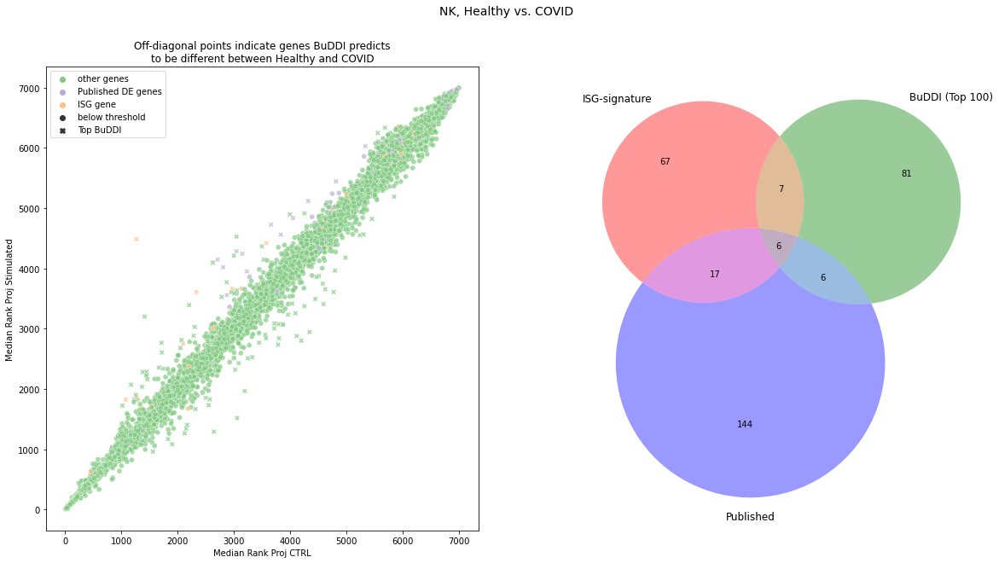

In [185]:
top_lim = 100

curr_cell_type = "NK"

Pub_DE = ["AC009501.4", "ACTB", "ACTG1", "ADAR", "ADD3", "AHNAK", "AKAP13", "ARHGAP25", "ARL4C", "ARPC2", "B2M", "BIN2", "BTG1", "BTN3A1", "BTN3A2", "C1orf63", "CALR", "CAP1", "CCL4", "CCL5", "CCND2", "CD247", "CD300A", "CD38", "CD3D", "CD3E", "CD3G", "CD8A", "CEP78", "CFL1", "CNOT6L", "CTSC", "CX3CR1", "CXCR4", "CXXC5", "CYBA", "DDX5", "DDX60", "DIP2A", "DNAJA1", "DTX3L", "EEF1A1", "EEF2", "EIF1", "EIF2AK2", "EIF4B", "EOMES", "EPSTI1", "ERAP2", "ETS1", "FCGR3A", "FGFBP2", "FYN", "GBP1", "GBP4", "GIMAP7", "GLTSCR2", "GNB2L1", "GNLY", "GNPTAB", "GPR56", "GZMA", "GZMB", "GZMH", "HBA2", "HBB", "HERC5", "HIST1H1E", "HLA-A", "HLA-B", "HLA-C", "HLA-E", "HLA-F", "HNRNPH1", "HSP90AA1", "HSP90AB1", "HSPA5", "HSPA8", "HSPH1", "ID2", "IFI16", "IFI44", "IFI44L", "IFI6", "IFIT1", "IFIT3", "IFITM2", "IGF2R", "IGHG1", "IGHM", "IGLC3", "IKZF3", "IL2RB", "IL32", "ISG15", "ISG20", "ITGB2", "IVNS1ABP", "JAK1", "KIAA1551", "KLRB1", "KLRD1", "KLRG1", "LAIR2", "LGALS1", "LPIN2", "LYST", "MACF1", "MATK", "MX1", "MX2", "MYBL1", "MYOM2", "NEAT1", "NFKBIA", "NLRC5", "OAS1", "OAS2", "OAS3", "PABPC1", "PARP14", "PARP9", "PLEK", "PLSCR1", "PNRC1", "PPP2R5C", "PRF1", "PRRC2B", "RBM39", "RNF213", "RP1-17K7.2", "RP11-94L15.2", "RSAD2", "RUNX3", "S100A4", "S100A8", "S100A9", "S100B", "S1PR5", "SAMD9", "SAMD9L", "SF3B1", "SLAMF7", "SLC25A6", "SP100", "SPEN", "SPOCK2", "SPON2", "SPTBN1", "STAT1", "STAT2", "SYK", "SYNE1", "SYNE2", "TAP2", "TMEM123", "TMSB10", "TMSB4X", "TNFAIP3", "TNFRSF1B", "TNFSF10", "TPT1", "TRDC", "TRDV2", "TRGC1", "TRGC2", "TRGV9", "TRIM22", "TSC22D3", "TXNIP", "VIM", "XAF1", "ZFP36L2"]


# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, ISG_genes))[0]] = "ISG gene"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes, Pub_DE))[0]] = "Published DE genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes, top_proj_genes))[0]] = "Top BuDDI"

fig, axs = plt.subplots(1, 2, figsize=(20,10))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Healthy and COVID", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(ISG_genes), set(top_proj_genes), set(Pub_DE)], set_labels = ("ISG-signature", 'BuDDI (Top 100)', 'Published'), ax=axs[1])


fig.suptitle(f"{curr_cell_type}, Healthy vs. COVID", fontsize=14)

fig.show()
